# Practice Session 09: Diffusion¶



Pytho cod with examples of diffusion processes on networks. It begins with some continous model using the diffussion euqations. Next, diffusion process on netowrks are explained and the eon library used to make simulations. The unit ends with som cnosiderations about inmunization.


**Author:** Jose Giner

**Date:** 4/4/22

## 1. Epidemic modeling


In [80]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
import networkx as nx
import random

Simple matematical model for SI (susceptible-infected)
- $S(t)$ susceptible: people not yet infected at time $t$
- $I(t)$ infected: people infected at time $t$

The equations of the model are

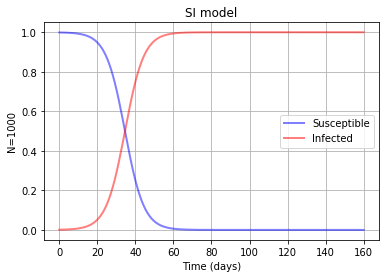

In [2]:
# Total population, N
N = 1000

# Initial number of infected individuals, I0
I0 = 1

# Everyone else, S0, is susceptible to infection initially.
S0 = N - I0

# Contact rate beta
beta = 0.2 

# A grid of time points (in days)
t = np.linspace(0, 160, 160)

# The SI model differential equations.
def deriv(y, t, N, beta):
    S, I = y
    dSdt = -beta * S / N * I 
    dIdt = beta * S * I / N 
    return dSdt, dIdt

# Initial conditions vector
y0 = S0, I0

# Integrate the SI equations over the time grid, t.
ret = odeint(deriv, y0, t, args=(N, beta))
S, I = ret.T

# Plot the data on three separate curves for S(t) and I(t)
fig = plt.figure(facecolor='w')
plt.plot(t, S/N, 'b', alpha=0.5, lw=2, label='Susceptible')
plt.plot(t, I/N, 'r', alpha=0.5, lw=2, label='Infected')
plt.xlabel('Time (days)')
plt.ylabel('N=1000')
plt.title('SI model')
plt.grid(True)
plt.legend()
plt.show()

In a SIS model (susceptible-infected-susceptible) the states are the same
- $S(t)$ susceptible: people not yet infected at time $t$
- $I(t)$ infected: people infected at time $t$

but people can be reinfected one recovered.

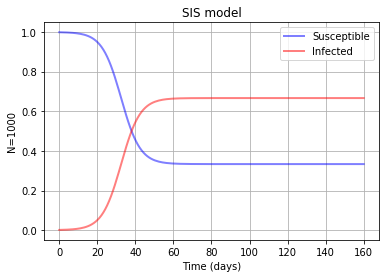

In [3]:
# Total population, N.
N = 1000

# Initial number of infected and recovered individuals, I0 and R0.
I0 = 1

# Everyone else, S0, is susceptible to infection initially.
S0 = N - I0

# Contact rate, beta, and mean recovery rate, gamma, (in 1/days).
beta, gamma = 0.3, 1./10 
# A grid of time points (in days)
t = np.linspace(0, 160, 160)

# The SIR model differential equations.
def deriv(y, t, N, beta, gamma):
    S, I = y
    dSdt = -beta * S / N * I + gamma * I
    dIdt = beta * S * I / N - gamma * I
    return dSdt, dIdt

# Initial conditions vector
y0 = S0, I0
# Integrate the SIR equations over the time grid, t.
ret = odeint(deriv, y0, t, args=(N, beta, gamma))
S, I = ret.T

# Plot the data on three separate curves for S(t) and I(t)
fig = plt.figure()
plt.plot(t, S/N, 'b', alpha=0.5, lw=2, label='Susceptible')
plt.plot(t, I/N, 'r', alpha=0.5, lw=2, label='Infected')
plt.xlabel('Time (days)')
plt.ylabel('N=1000')
plt.title('SIS model')
plt.grid(True)
plt.legend()
plt.show()

A SIS model has two possible outcomes
- endemic state $\gamma < \beta$
- disease free $\gamma > \beta$

We write the characteristic time of a pathogen as

$$ \tau = \frac{1}{\gamma(R_0-1)}$$

where $R_0$ is the reproduction number

$$R_0 = \frac{\beta}{\gamma}$$

It represents the average number of susceptible individulas infected by one infected person. If $R_0 > 1$ the cases incresases (exponentially if $R_0 \geq 2$)

In [4]:
R0 = beta / gamma
tau = 1 / (gamma * (R0 - 1))
print("Rep number R0 =", R0)
print("Char time tau =", tau, "days")

Rep number R0 = 2.9999999999999996
Char time tau = 5.000000000000001 days


In a SIR model people can be in three states
- $𝑆(𝑡)$  susceptible: people not yet infected at time  $𝑡$ 
- $𝐼(𝑡)$  infected: people infected at time  $𝑡$
- $R(t)$ removed: people that have recovered for the disease or have dead

Once removed, people is inmune and can't be reinfected

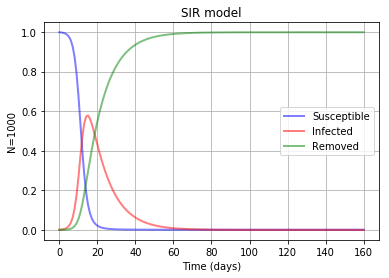

In [5]:
# Total population, N.
N = 1000

# Initial number of infected and recovered individuals, I0 and R0.
I0, R0 = 1, 0

# Everyone else, S0, is susceptible to infection initially.
S0 = N - I0 - R0

# Contact rate, beta, and mean recovery rate, gamma, (in 1/days).
beta, gamma = 0.7, 1./10 

# A grid of time points (in days)
t = np.linspace(0, 160, 160)

# The SIS model differential equations.
def deriv(y, t, N, beta, gamma):
    S, I, R = y
    dSdt = -beta * S * I / N
    dIdt = beta * S * I / N - gamma * I
    dRdt = gamma * I
    return dSdt, dIdt, dRdt

# Initial conditions vector
y0 = S0, I0, R0
# Integrate the SIR equations over the time grid, t.
ret = odeint(deriv, y0, t, args=(N, beta, gamma))
S, I, R = ret.T

# Plot the data on three separate curves for S(t) and I(t)
fig = plt.figure()
plt.plot(t, S/N, 'b', alpha=0.5, lw=2, label='Susceptible')
plt.plot(t, I/N, 'r', alpha=0.5, lw=2, label='Infected')
plt.plot(t, R/N, 'g', alpha=0.5, lw=2, label='Removed')
plt.xlabel('Time (days)')
plt.ylabel('N=1000')
plt.title('SIR model')
plt.grid(True)
plt.legend()
plt.show()

**Exercise:**
Modify the model to include deaths due to the disease. Use a $\mu$ parameter and include it in the equation

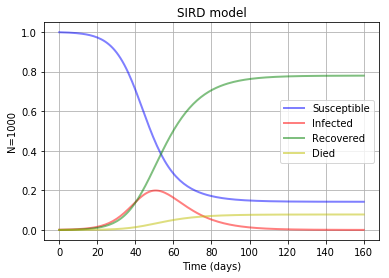

In [6]:
# your code here
# Total population, N.
N = 1000

# Initial number of infected and recovered individuals, I0 and R0.
I0, R0, D0 = 1, 0, 0 

# Everyone else, S0, is susceptible to infection initially.
S0 = N - I0 - R0 - D0

# Contact rate, beta, and mean recovery rate, gamma, (in 1/days).
beta, gamma, mu = 0.25, 1./10 , 0.01

# A grid of time points (in days)
t = np.linspace(0, 160, 160)

# The SIS model differential equations.
def deriv(y, t, N, beta, gamma, mu):
    S, I, R, D = y
    dSdt = -beta * S * I / N
    dIdt = beta * S * I / N - gamma * I - mu * I
    dRdt = gamma * I
    dDdt = mu * I
    return dSdt, dIdt, dRdt, dDdt

# Initial conditions vector
y0 = S0, I0, R0, D0
# Integrate the SIR equations over the time grid, t.
ret = odeint(deriv, y0, t, args=(N, beta, gamma, mu))
S, I, R, D = ret.T

# Plot the data on three separate curves for S(t) and I(t)
fig = plt.figure()
plt.plot(t, S/N, 'b', alpha=0.5, lw=2, label='Susceptible')
plt.plot(t, I/N, 'r', alpha=0.5, lw=2, label='Infected')
plt.plot(t, R/N, 'g', alpha=0.5, lw=2, label='Recovered')
plt.plot(t, D/N, 'y', alpha=0.5, lw=2, label='Died')
plt.xlabel('Time (days)')
plt.ylabel('N=1000')
plt.title('SIRD model')
plt.grid(True)
plt.legend()
plt.show()

## 2. Epidemics in networks

Implement a SI model over a contact network
- add all nodes to a S set / list
- chose randomly an infected node and add it to a I set
- repeat until end of period
    - identify the neighbors of currently infected nodes
    - infect them with a probability beta
    - add the new infected nodes to I
    - remove the new infected nodes from S

Day 1
Infected nodes: 1


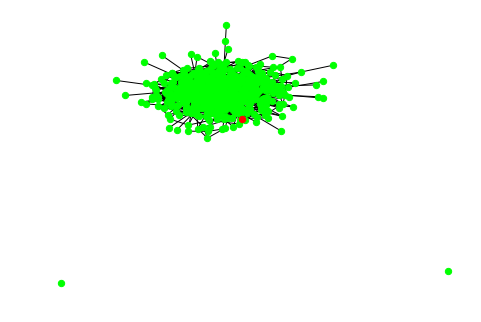

Day 2
Infected nodes: 2


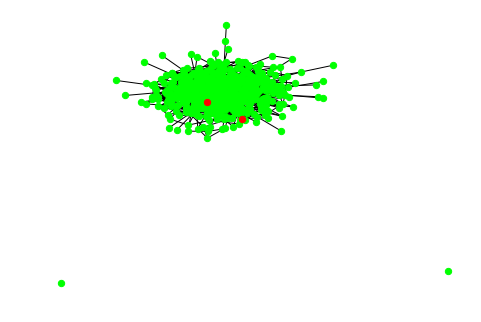

Day 3
Infected nodes: 8


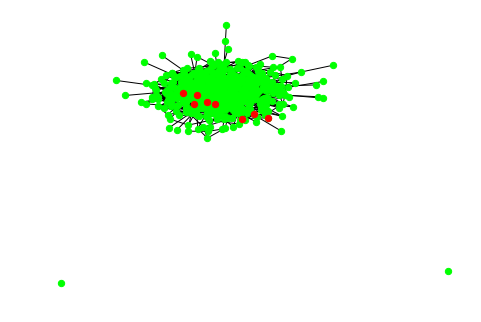

Day 4
Infected nodes: 26


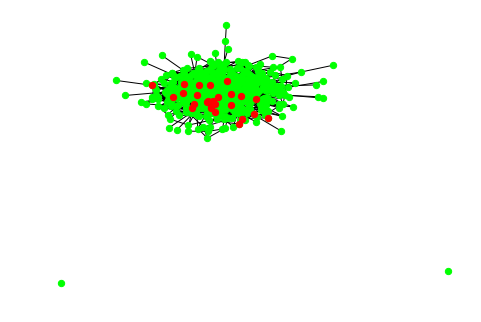

Day 5
Infected nodes: 76


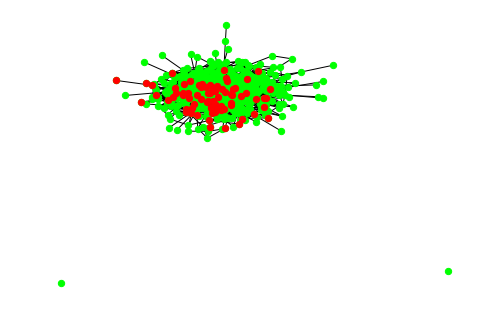

Day 6
Infected nodes: 162


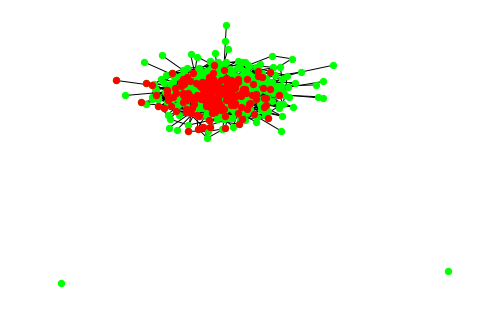

Day 7
Infected nodes: 283


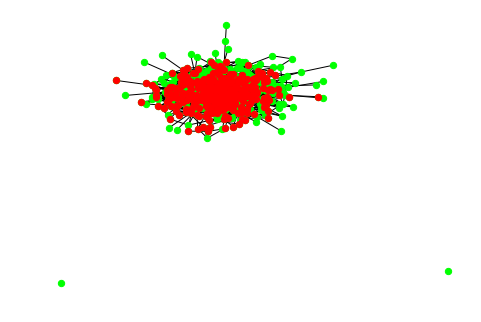

Day 8
Infected nodes: 388


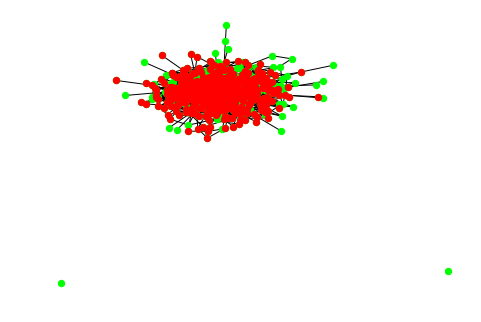

Day 9
Infected nodes: 441


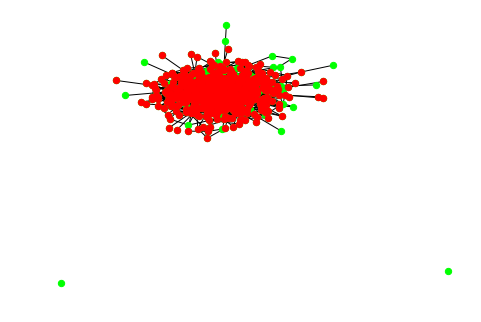

Day 10
Infected nodes: 470


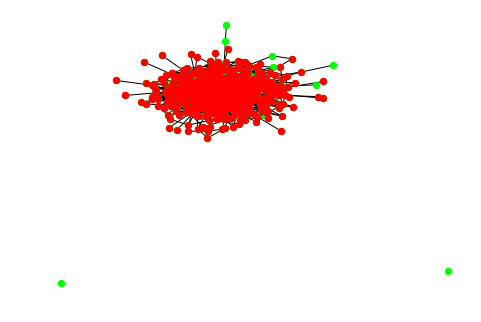

Day 11
Infected nodes: 483


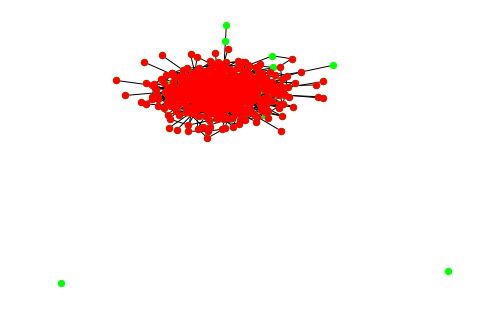

Day 12
Infected nodes: 490


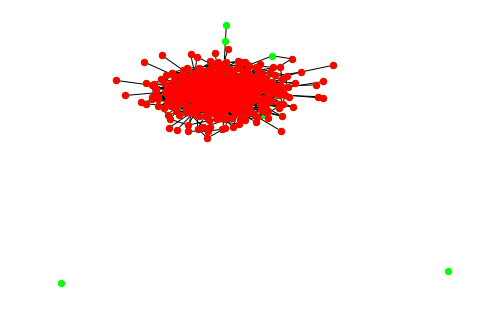

Day 13
Infected nodes: 492


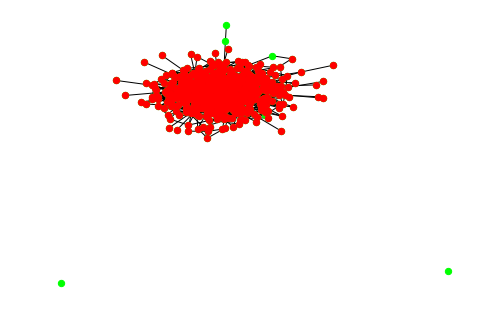

In [7]:
# your code here
import networkx as nx
import random

n , p = 500, 0.01
G = nx.erdos_renyi_graph(n, p)
pos = nx.spring_layout(G)
infected, susceptible = [], [n for n in G.nodes()]
total_infected, total_susceptible = [] , []
beta = 0.5
start_node = np.random.randint(n)
infected.append(start_node)
susceptible.remove(start_node)

total_infected.append(len(infected))
total_susceptible.append(len(susceptible))


#fig, axes = plt.subplots(2,2,figsize = (12,10))
day = 1
print('Day {}'.format(day))
print('Infected nodes: {}'.format(len(infected)))
nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
plt.show()

num_days = 13
for day in range(1,num_days):
    day += 1
    
    frontier = nx.node_boundary(G,infected)
    #frontier = frontier + [n for n in G.neighbors(node) if n not in infected]
    for node in frontier:
        p = random.random()
        if p < beta:
            infected.append(node)
            susceptible.remove(node)
    
    total_infected.append(len(infected))
    total_susceptible.append(len(susceptible))
    
    print('Day {}'.format(day))
    print('Infected nodes: {}'.format(len(infected)))
    nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
    nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
    plt.show()



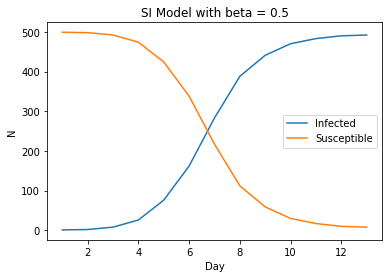

In [8]:
plt.plot(range(1,num_days+1), total_infected, label = 'Infected')
plt.plot(range(1,num_days+1), total_susceptible, label = 'Susceptible')
plt.xlabel('Day')
plt.ylabel('N')
plt.title('SI Model with beta = {}'.format(str(beta)))
plt.legend()
plt.show()

SIS or SIR models are more complicated to implement because you have to consider the recover period. Usually is model with a Poisson distribution. You can use the **eon library** to simulate diffusion in networks

5.999999999999999
doing Gillespie simulation
done with simulation, now plotting


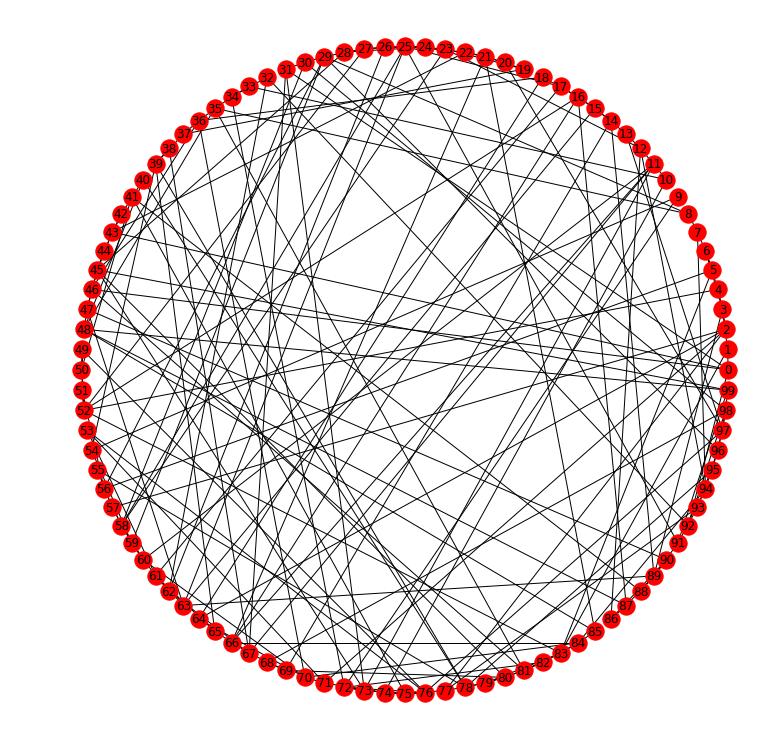

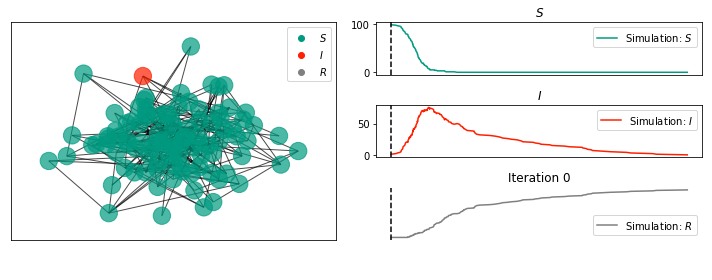

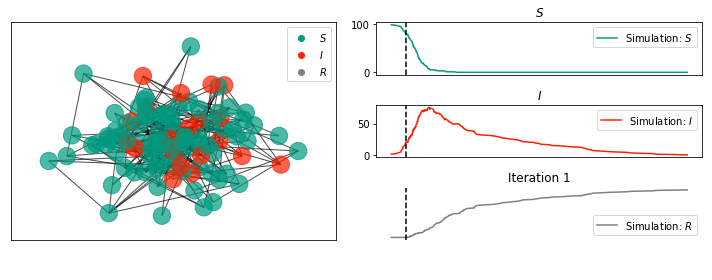

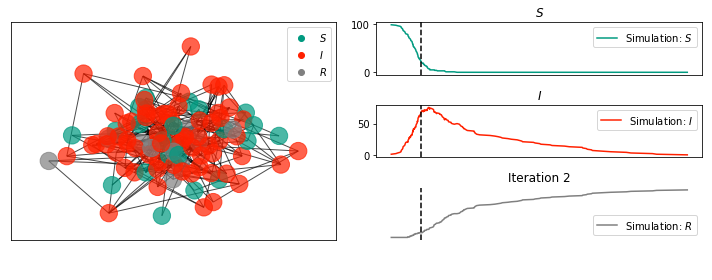

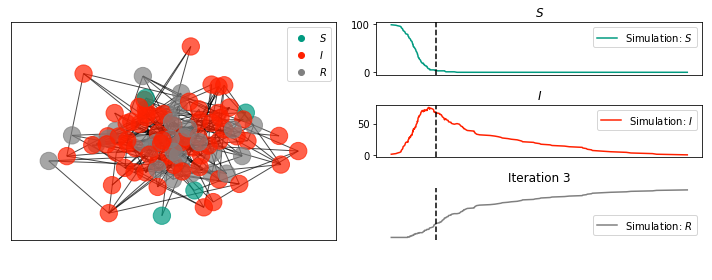

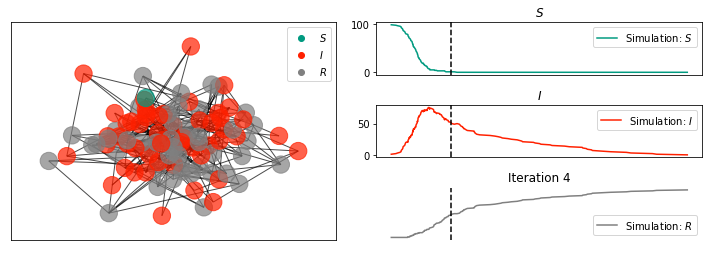

In [10]:
import EoN
import networkx as nx

gamma = 0.2  
beta = 1.2 
r_0 = beta/gamma
print(r_0)

N = 100 # population size
I0 = 1   # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0


#optional arguments to be passed on to the
nx_kwargs = {"pos": pos, "alpha": 0.7} 

g=nx.watts_strogatz_graph(n=100, k=4, p=0.6)
pos = nx.spring_layout(g)
plt.figure(figsize=(10,10))
nx.draw_circular(g, with_labels = True)


print("doing Gillespie simulation")
sim = EoN.Gillespie_SIR(g, tau = beta, gamma=gamma, rho = I0/N, return_full_data=True)
print("done with simulation, now plotting")

for i in range(0,5,1):
    sim.display(time = i,  **nx_kwargs)
    plt.axis('off') 
    plt.title("Iteration {}".format(i))
    plt.draw()

## 3. Inmunization

To inmunize a part of the network, you can make them invisible for the infected nodes. Yo can do it just removing them from the susceptible list.

Implement a SI model with inmujnization
- compare random and scale-free networks
- try random and selective inmunization (degree and betweenness)
- find experimentally (trial and error) the **herd inmunity** value

Random inmunization (10% of nodes) in random network

Day 1
Infected nodes: 1


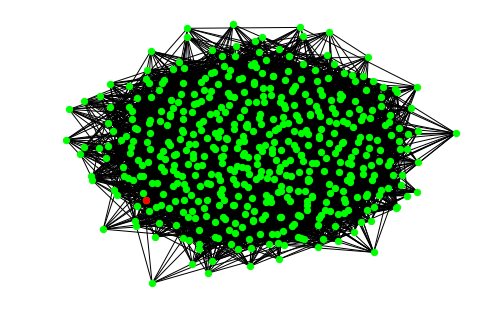

Day 2
Infected nodes: 10


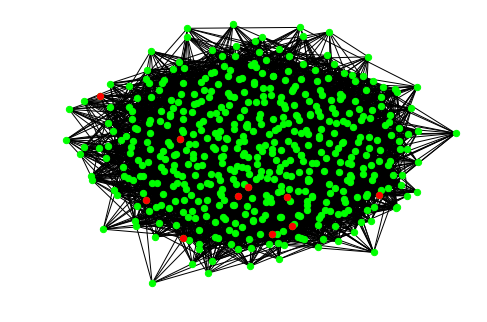

Day 3
Infected nodes: 81


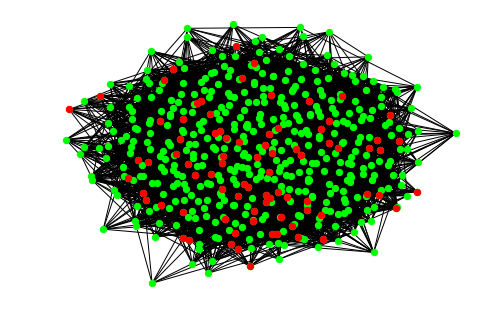

Day 4
Infected nodes: 282


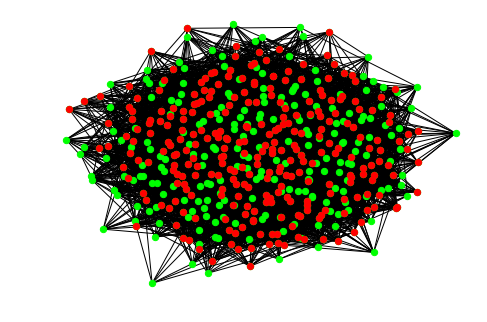

Day 5
Infected nodes: 362


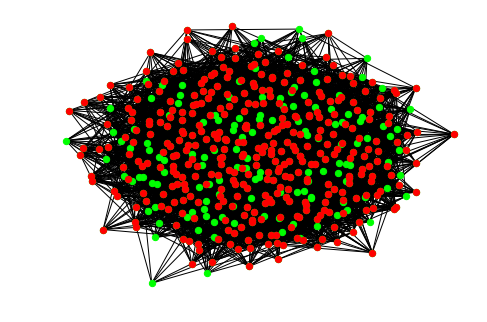

Day 6
Infected nodes: 406


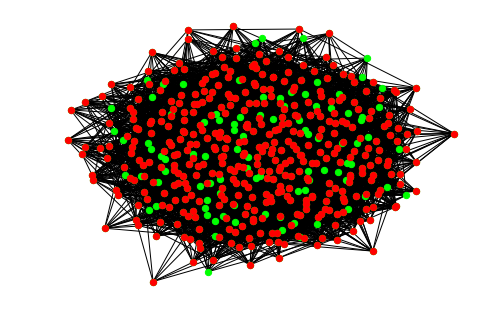

Day 7
Infected nodes: 426


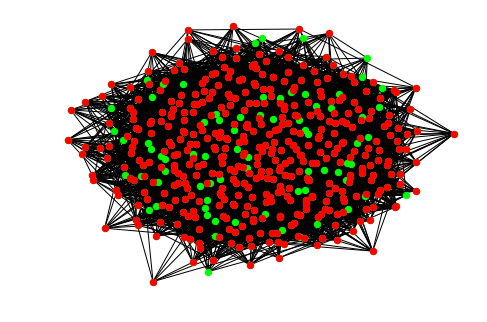

Day 8
Infected nodes: 436


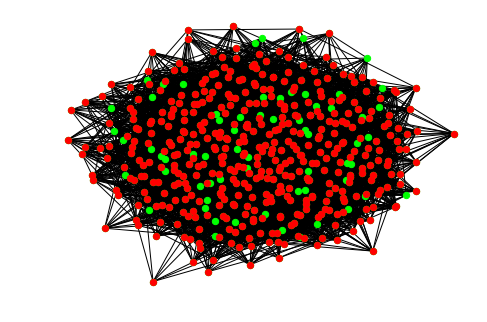

Day 9
Infected nodes: 442


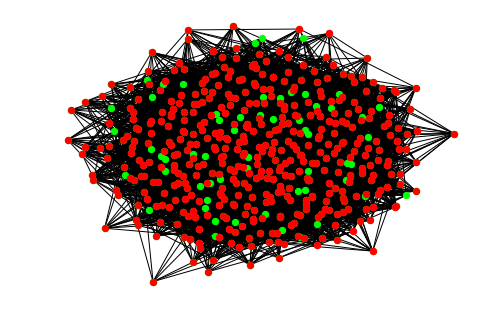

Day 10
Infected nodes: 445


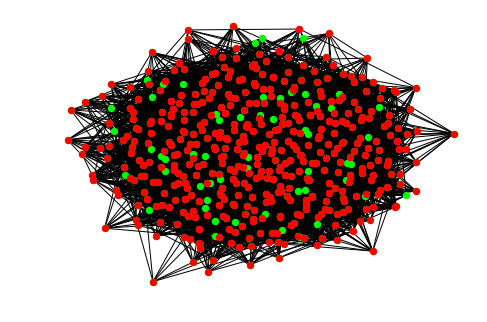

Day 11
Infected nodes: 446


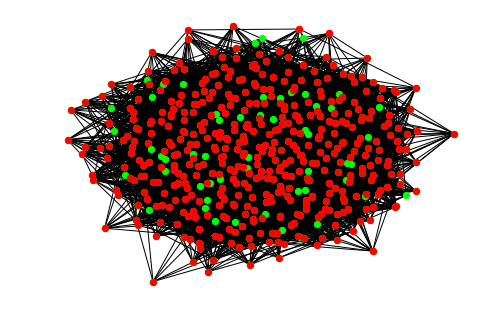

Day 12
Infected nodes: 448


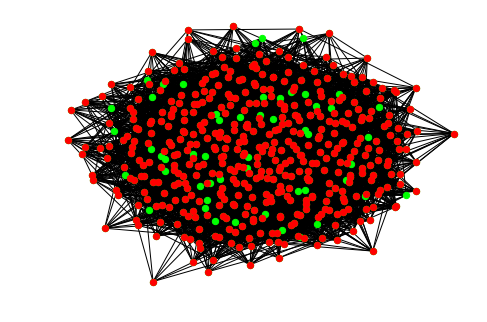

Day 13
Infected nodes: 448


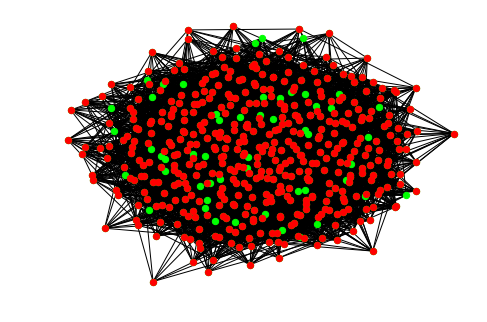

Day 14
Infected nodes: 449


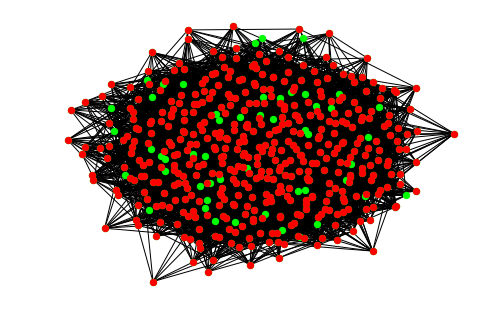

Day 15
Infected nodes: 449


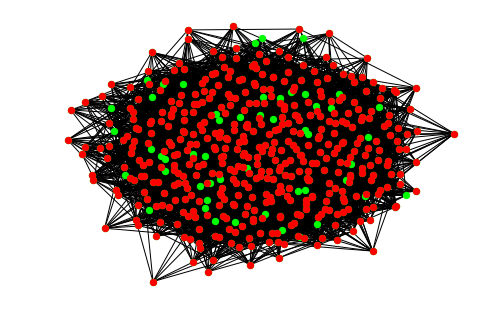

Day 16
Infected nodes: 449


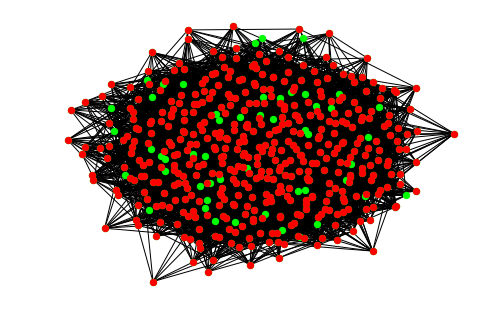

Day 17
Infected nodes: 449


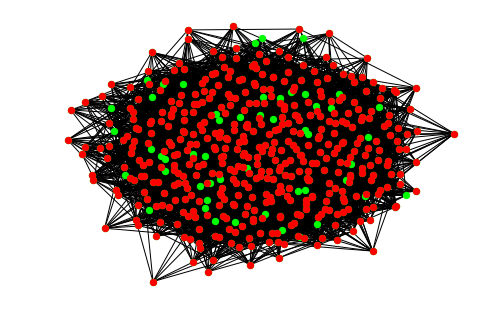

Day 18
Infected nodes: 450


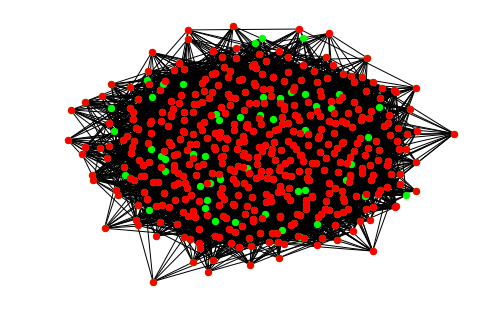

Day 19
Infected nodes: 450


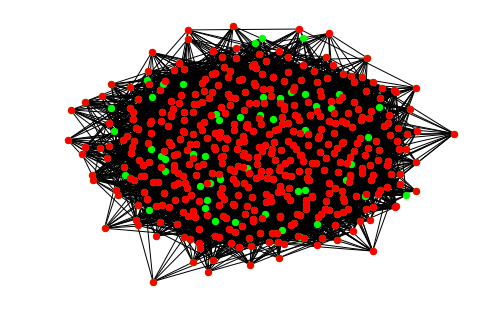

Day 20
Infected nodes: 450


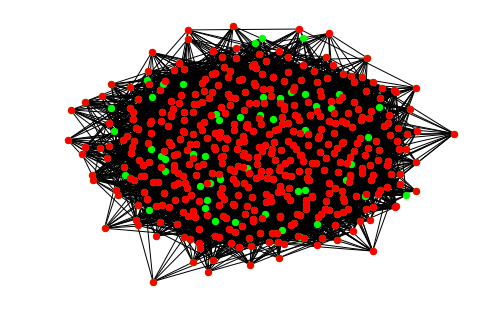

In [35]:
n , p = 500, 0.05
G = nx.erdos_renyi_graph(n, p)
pos = nx.spring_layout(G)

nodes = list(G.nodes())
random.shuffle(nodes)
inmune = nodes[:int(n*0.1)]
infected, susceptible = [], nodes[int(n*0.1):]
total_infected, total_susceptible = [] , []

beta = 0.5
start_node = random.choice(susceptible)
infected.append(start_node)
susceptible.remove(start_node)

total_infected.append(len(infected))
total_susceptible.append(len(susceptible))


#fig, axes = plt.subplots(2,2,figsize = (12,10))
day = 1
print('Day {}'.format(day))
print('Infected nodes: {}'.format(len(infected)))
nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
plt.show()

num_days = 20
total_inmune = [len(inmune) for i in range(num_days)]
for day in range(1,num_days):
    day += 1
    
    frontier = nx.node_boundary(G,infected)
    #frontier = frontier + [n for n in G.neighbors(node) if n not in infected]
    for node in frontier:
        if node not in inmune:
            p = random.random()
            if p < beta:
                infected.append(node)
                susceptible.remove(node)
    
    total_infected.append(len(infected))
    total_susceptible.append(len(susceptible))
    
    print('Day {}'.format(day))
    print('Infected nodes: {}'.format(len(infected)))
    nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
    nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
    plt.show()

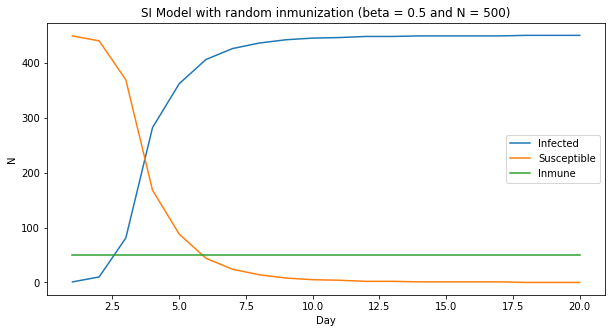

In [36]:
plt.figure(figsize = (10,5))
plt.plot(range(1,num_days+1), total_infected, label = 'Infected')
plt.plot(range(1,num_days+1), total_susceptible, label = 'Susceptible')
plt.plot(range(1,num_days+1), total_inmune, label = 'Inmune')
plt.xlabel('Day')
plt.ylabel('N')
plt.title('SI Model with random inmunization (beta = {} and N = {})'.format(str(beta),str(n)))
plt.legend()
plt.show()


Random inmunization (10% of nodes) in barabasi graph

Day 1
Infected nodes: 1


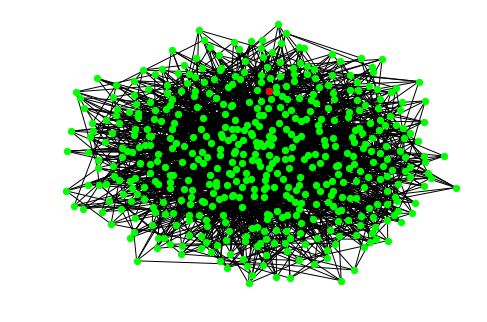

Day 2
Infected nodes: 7


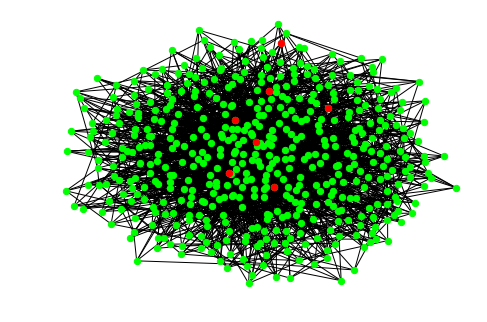

Day 3
Infected nodes: 34


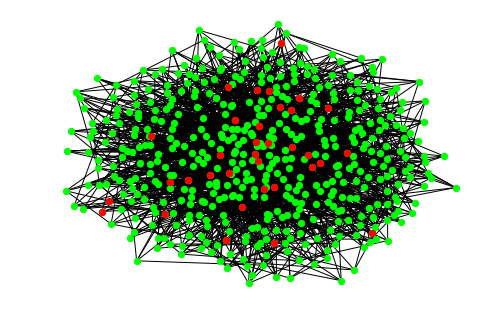

Day 4
Infected nodes: 154


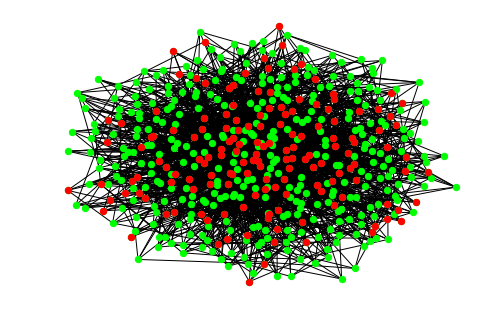

Day 5
Infected nodes: 294


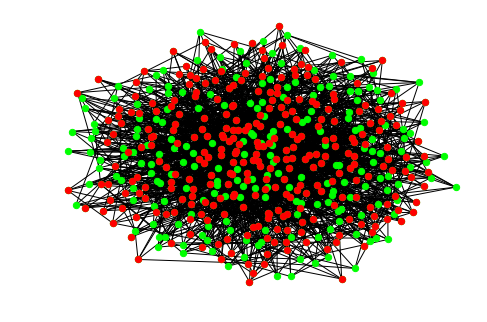

Day 6
Infected nodes: 370


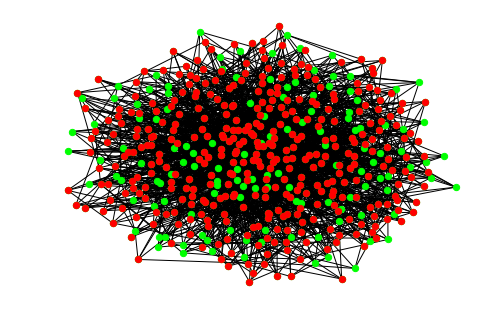

Day 7
Infected nodes: 409


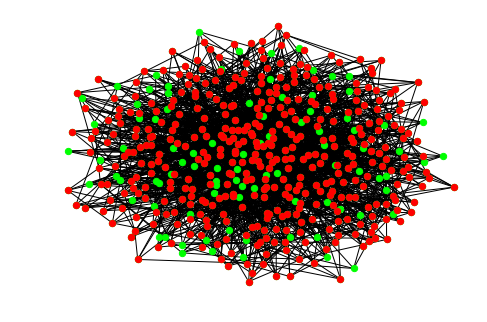

Day 8
Infected nodes: 436


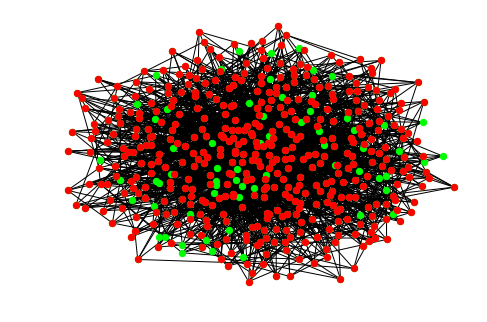

Day 9
Infected nodes: 444


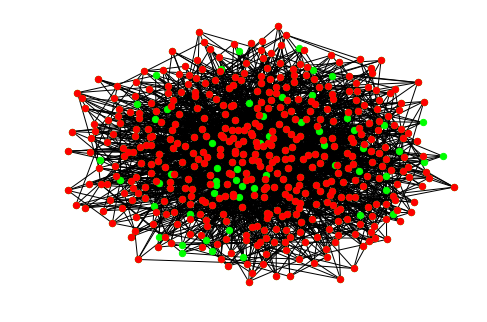

Day 10
Infected nodes: 447


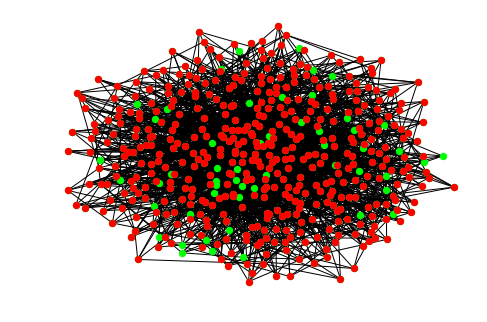

Day 11
Infected nodes: 450


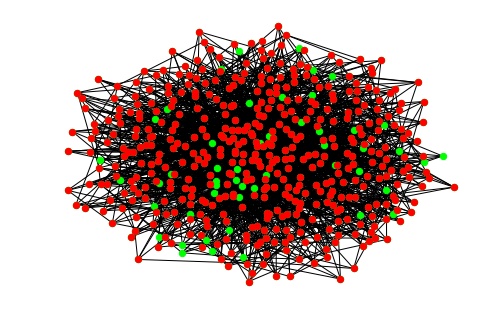

Day 12
Infected nodes: 450


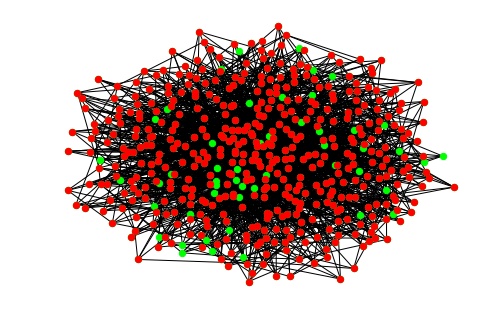

Day 13
Infected nodes: 450


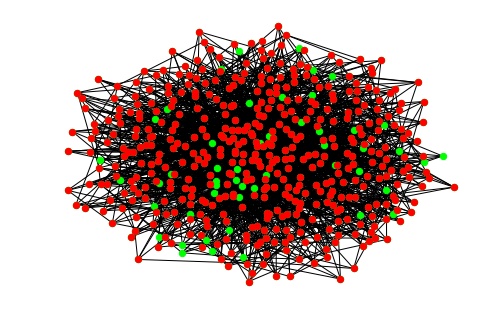

Day 14
Infected nodes: 450


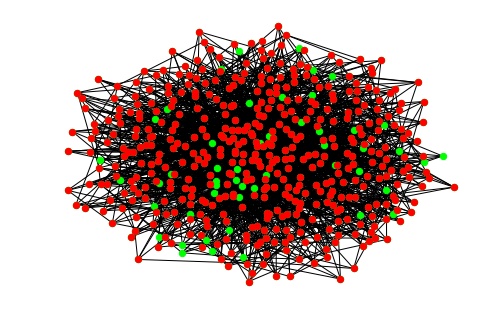

Day 15
Infected nodes: 450


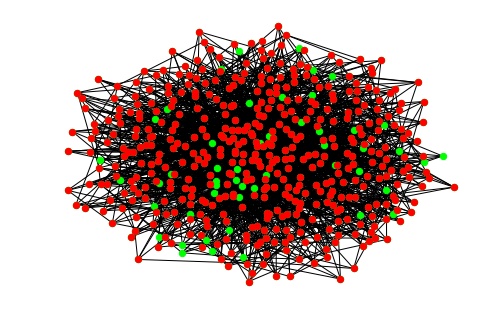

Day 16
Infected nodes: 450


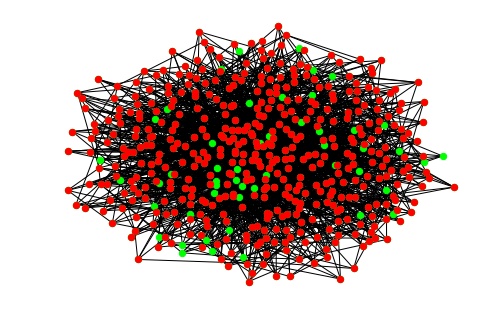

Day 17
Infected nodes: 450


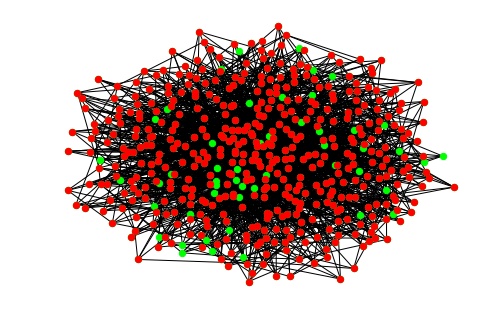

Day 18
Infected nodes: 450


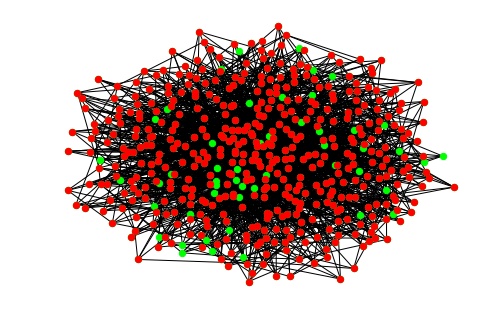

Day 19
Infected nodes: 450


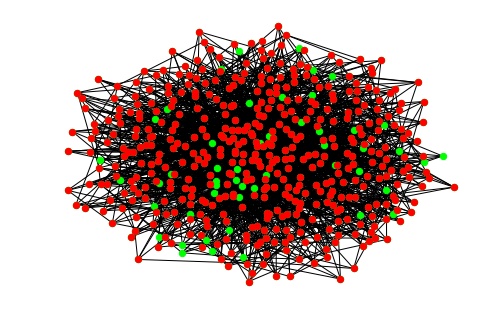

Day 20
Infected nodes: 450


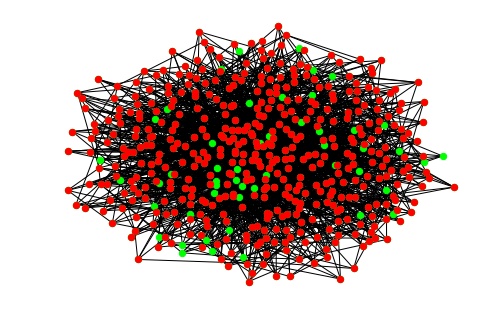

In [19]:
n , m = 500, 5
G = nx.barabasi_albert_graph(n, m)
pos = nx.spring_layout(G)

nodes = list(G.nodes())
random.shuffle(nodes)
inmune = nodes[:int(n*0.1)]
infected, susceptible = [], nodes[int(n*0.1):]
total_infected, total_susceptible = [] , []

beta = 0.5
start_node = random.choice(susceptible)
infected.append(start_node)
susceptible.remove(start_node)

total_infected.append(len(infected))
total_susceptible.append(len(susceptible))


#fig, axes = plt.subplots(2,2,figsize = (12,10))
day = 1
print('Day {}'.format(day))
print('Infected nodes: {}'.format(len(infected)))
nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
plt.show()

num_days = 20
total_inmune = [len(inmune) for i in range(num_days)]
for day in range(1,num_days):
    day += 1
    
    frontier = nx.node_boundary(G,infected)
    #frontier = frontier + [n for n in G.neighbors(node) if n not in infected]
    for node in frontier:
        if node not in inmune:
            p = random.random()
            if p < beta:
                infected.append(node)
                susceptible.remove(node)
    
    total_infected.append(len(infected))
    total_susceptible.append(len(susceptible))
    
    print('Day {}'.format(day))
    print('Infected nodes: {}'.format(len(infected)))
    nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
    nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
    plt.show()



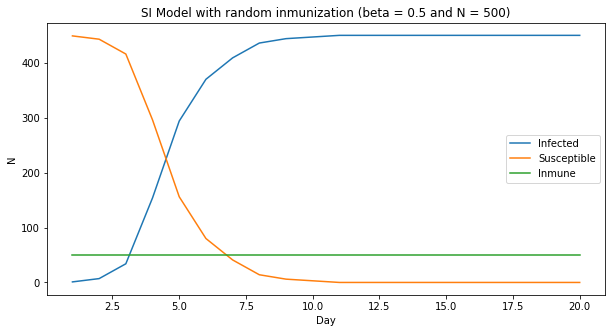

In [20]:
plt.figure(figsize = (10,5))
plt.plot(range(1,num_days+1), total_infected, label = 'Infected')
plt.plot(range(1,num_days+1), total_susceptible, label = 'Susceptible')
plt.plot(range(1,num_days+1), total_inmune, label = 'Inmune')
plt.xlabel('Day')
plt.ylabel('N')
plt.title('SI Model with random inmunization (beta = {} and N = {})'.format(str(beta),str(n)))
plt.legend()
plt.show()

Selective inmunization by degree (10%) in barabasi graph

Day 1
Infected nodes: 1


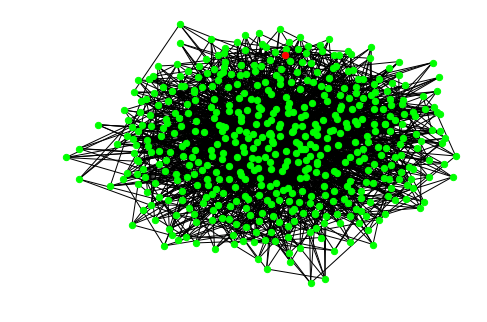

Day 2
Infected nodes: 4


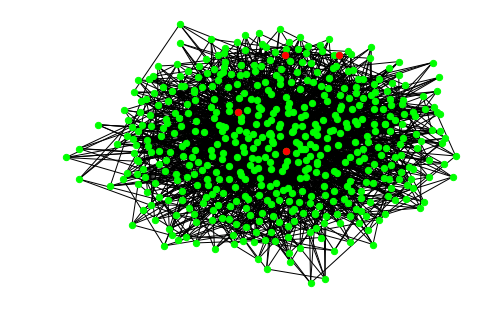

Day 3
Infected nodes: 15


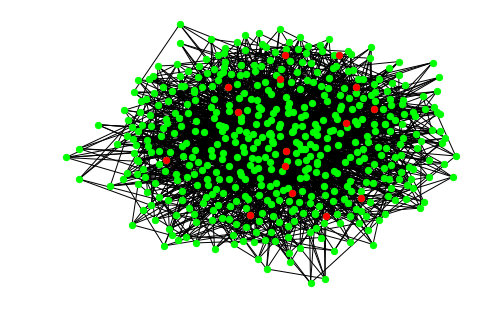

Day 4
Infected nodes: 43


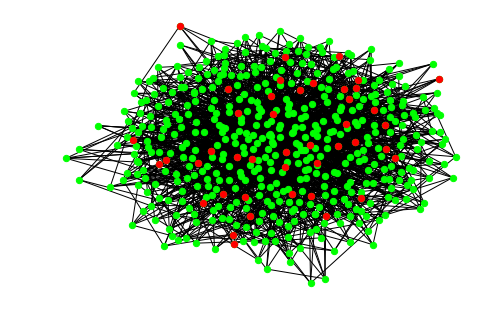

Day 5
Infected nodes: 114


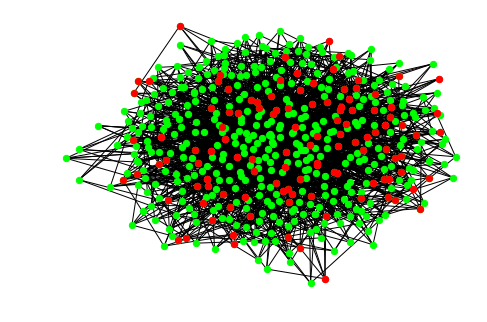

Day 6
Infected nodes: 221


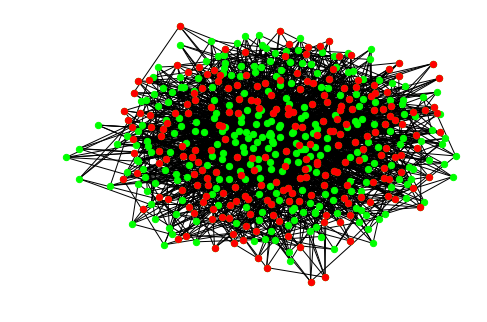

Day 7
Infected nodes: 311


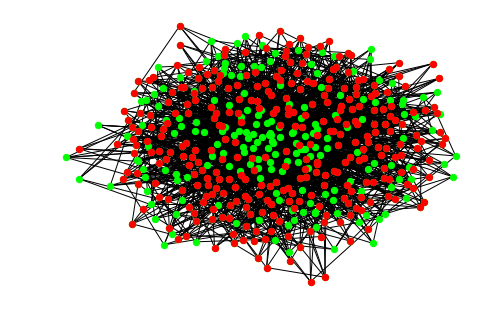

Day 8
Infected nodes: 371


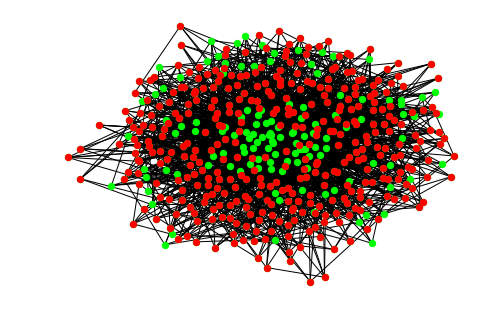

Day 9
Infected nodes: 417


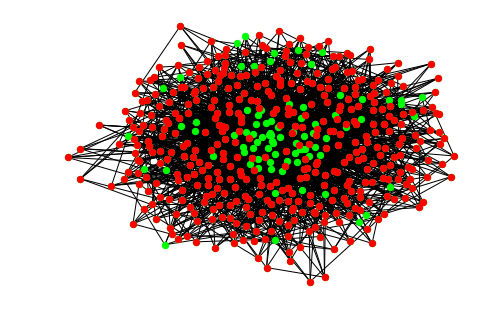

Day 10
Infected nodes: 433


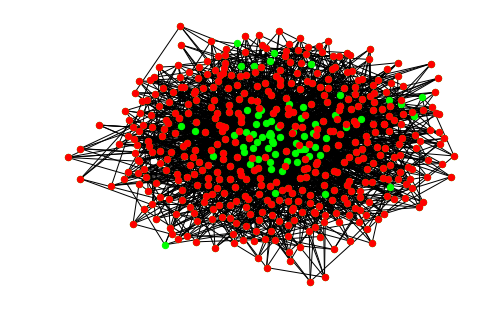

Day 11
Infected nodes: 438


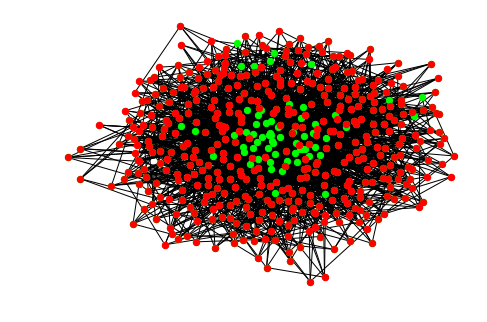

Day 12
Infected nodes: 441


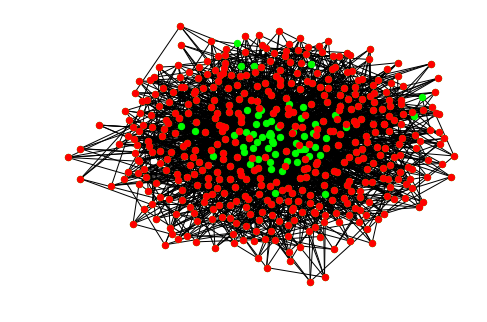

Day 13
Infected nodes: 443


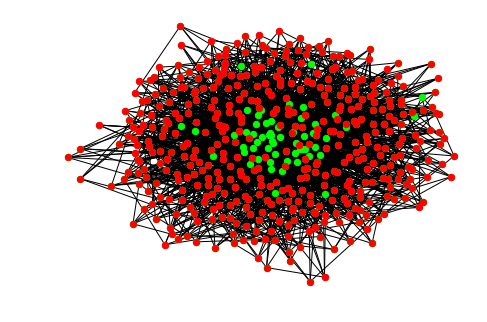

Day 14
Infected nodes: 447


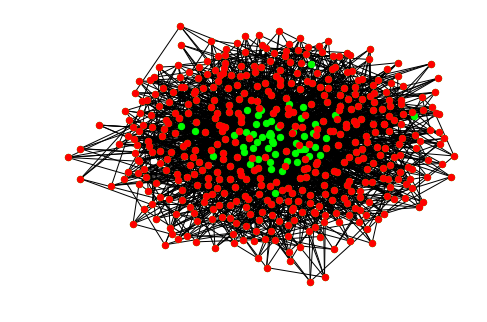

Day 15
Infected nodes: 447


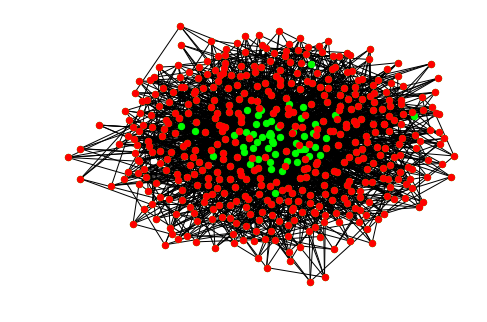

Day 16
Infected nodes: 447


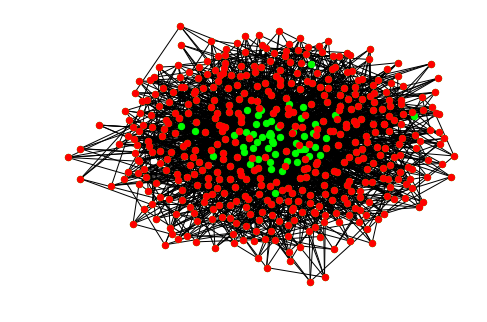

Day 17
Infected nodes: 447


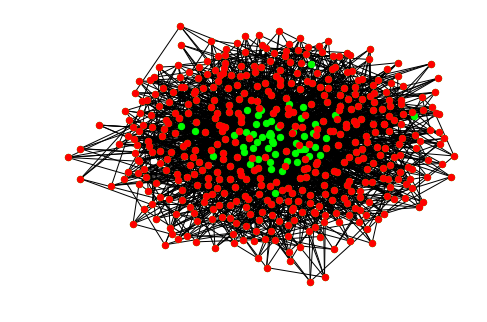

Day 18
Infected nodes: 447


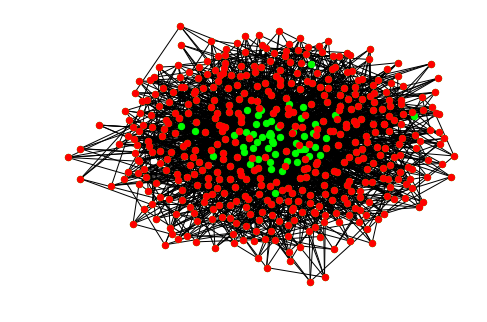

Day 19
Infected nodes: 447


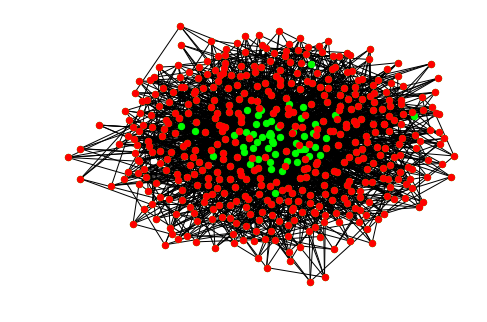

Day 20
Infected nodes: 447


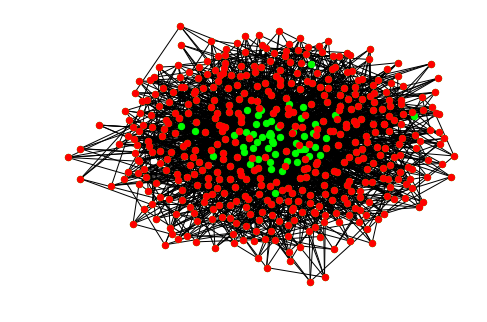

In [29]:
n , m = 500, 5
G = nx.barabasi_albert_graph(n, m)
pos = nx.spring_layout(G)

nodes = []
degrees = sorted(G.degree, key=lambda x: x[1], reverse=True)
for nod,d in degrees:
    nodes.append(nod)
    
inmune = nodes[:int(n*0.1)]
infected, susceptible = [], nodes[int(n*0.1):]
total_infected, total_susceptible = [] , []
beta = 0.5
start_node = random.choice(susceptible)
infected.append(start_node)
susceptible.remove(start_node)

total_infected.append(len(infected))
total_susceptible.append(len(susceptible))


#fig, axes = plt.subplots(2,2,figsize = (12,10))
day = 1
print('Day {}'.format(day))
print('Infected nodes: {}'.format(len(infected)))
nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
plt.show()

num_days = 20
total_inmune = [len(inmune) for i in range(num_days)]
for day in range(1,num_days):
    day += 1
    
    frontier = nx.node_boundary(G,infected)
    #frontier = frontier + [n for n in G.neighbors(node) if n not in infected]
    for node in frontier:
        if node not in inmune:
            p = random.random()
            if p < beta:
                infected.append(node)
                susceptible.remove(node)
    
    total_infected.append(len(infected))
    total_susceptible.append(len(susceptible))
    
    print('Day {}'.format(day))
    print('Infected nodes: {}'.format(len(infected)))
    nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
    nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
    plt.show()



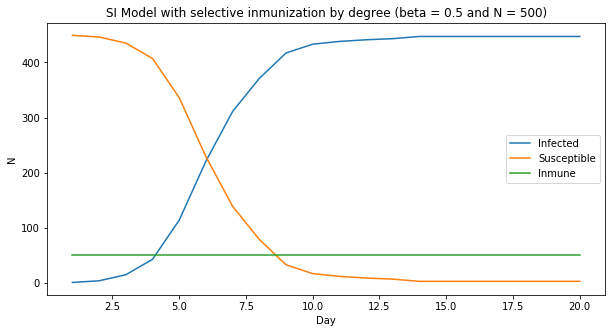

In [30]:
plt.figure(figsize = (10,5))
plt.plot(range(1,num_days+1), total_infected, label = 'Infected')
plt.plot(range(1,num_days+1), total_susceptible, label = 'Susceptible')
plt.plot(range(1,num_days+1), total_inmune, label = 'Inmune')
plt.xlabel('Day')
plt.ylabel('N')
plt.title('SI Model with selective inmunization by degree (beta = {} and N = {})'.format(str(beta),str(n)))
plt.legend()
plt.show()

Selective inmunization by betweenness centrality (10%) in barabasi graph

Day 1
Infected nodes: 1


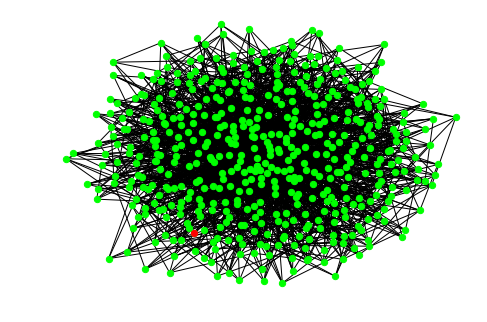

Day 2
Infected nodes: 4


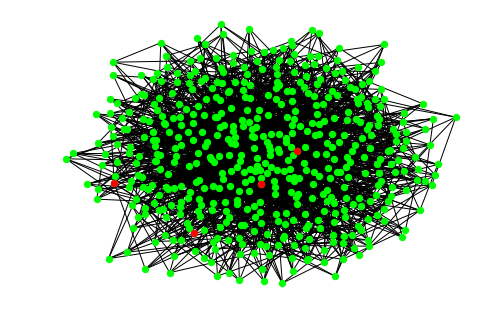

Day 3
Infected nodes: 13


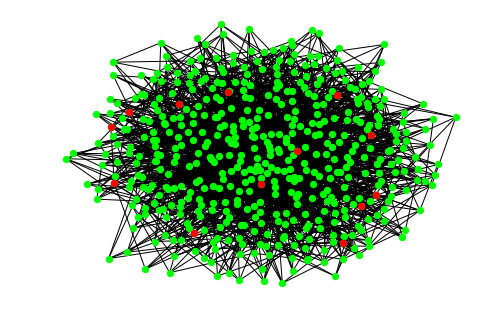

Day 4
Infected nodes: 35


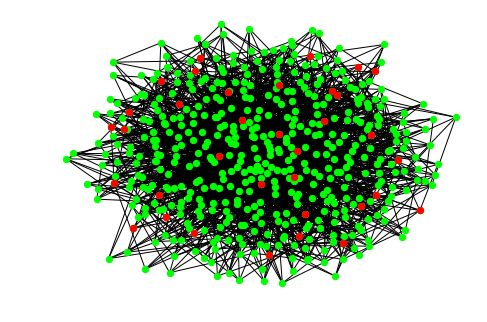

Day 5
Infected nodes: 84


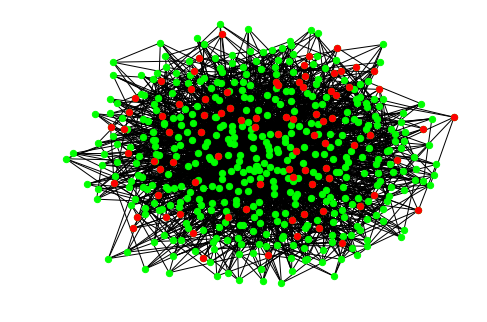

Day 6
Infected nodes: 188


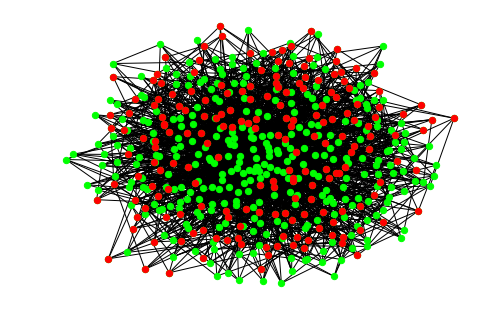

Day 7
Infected nodes: 289


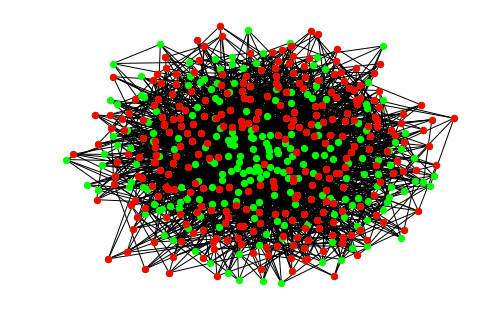

Day 8
Infected nodes: 370


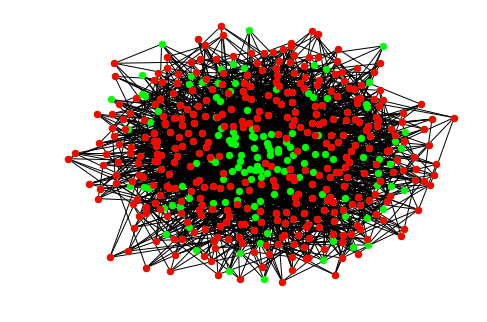

Day 9
Infected nodes: 410


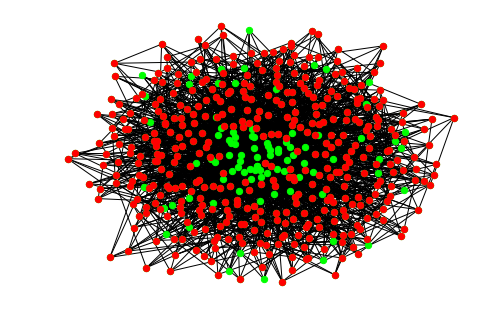

Day 10
Infected nodes: 437


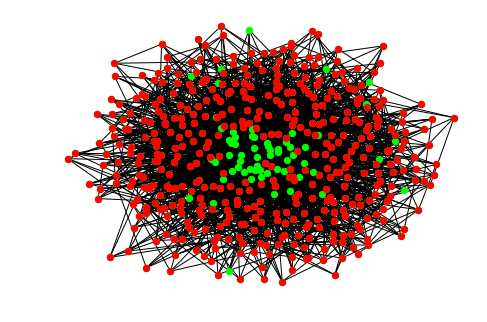

Day 11
Infected nodes: 444


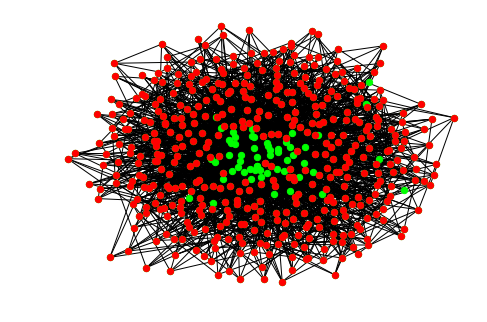

Day 12
Infected nodes: 448


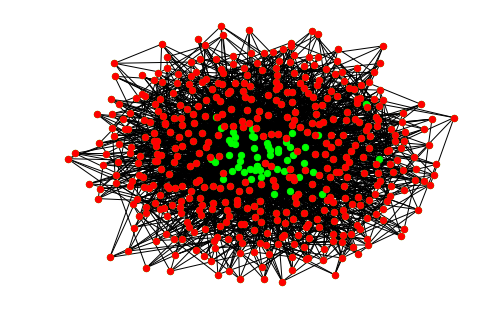

Day 13
Infected nodes: 449


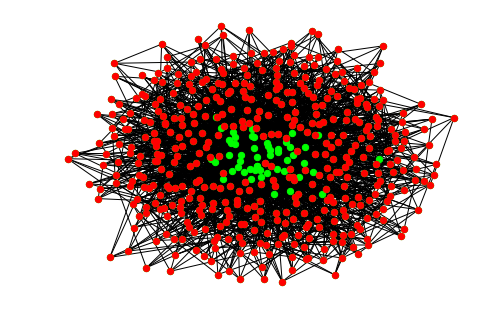

Day 14
Infected nodes: 449


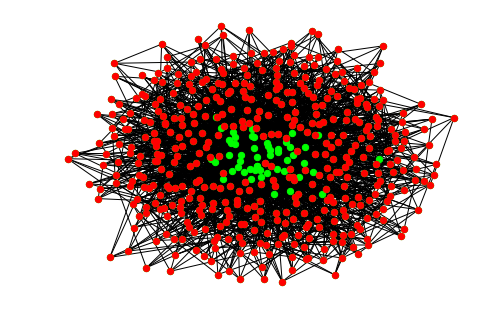

Day 15
Infected nodes: 449


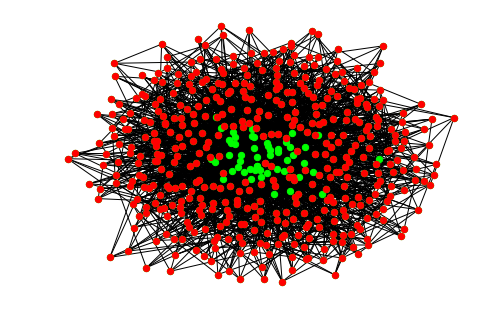

Day 16
Infected nodes: 449


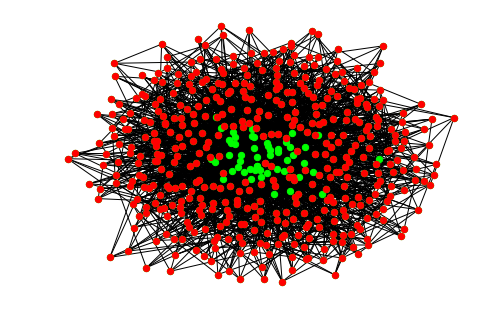

Day 17
Infected nodes: 450


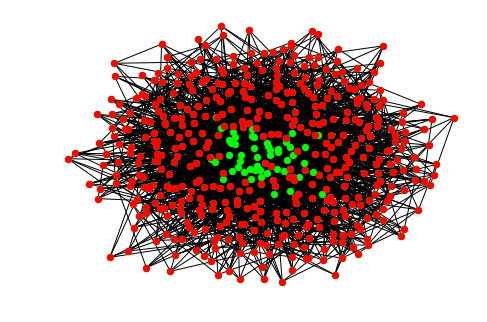

Day 18
Infected nodes: 450


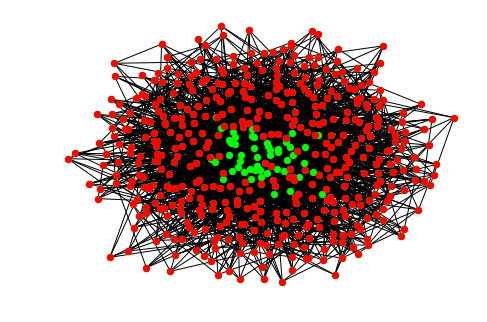

Day 19
Infected nodes: 450


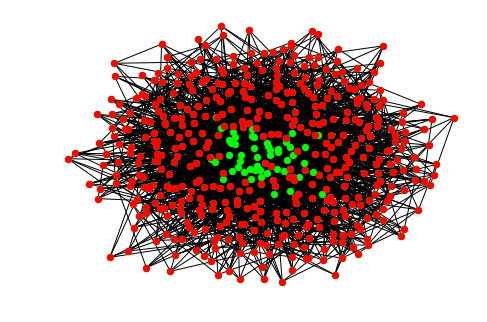

Day 20
Infected nodes: 450


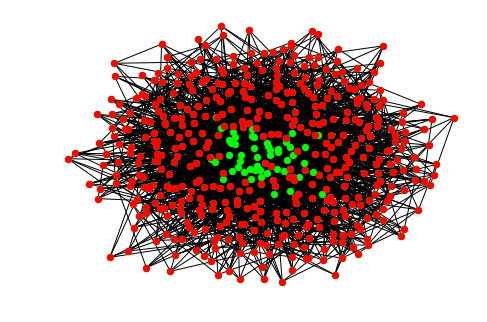

In [31]:
n , m = 500, 5
G = nx.barabasi_albert_graph(n, m)
pos = nx.spring_layout(G)

bet = nx.betweenness_centrality(G)
nodes = sorted(bet, key=bet.get, reverse=True)

    
inmune = nodes[:int(n*0.1)]
infected, susceptible = [], nodes[int(n*0.1):]
total_infected, total_susceptible = [] , []
beta = 0.5
start_node = random.choice(susceptible)
infected.append(start_node)
susceptible.remove(start_node)

total_infected.append(len(infected))
total_susceptible.append(len(susceptible))


#fig, axes = plt.subplots(2,2,figsize = (12,10))
day = 1
print('Day {}'.format(day))
print('Infected nodes: {}'.format(len(infected)))
nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
plt.show()

num_days = 20
total_inmune = [len(inmune) for i in range(num_days)]
for day in range(1,num_days):
    day += 1
    
    frontier = nx.node_boundary(G,infected)
    #frontier = frontier + [n for n in G.neighbors(node) if n not in infected]
    for node in frontier:
        if node not in inmune:
            p = random.random()
            if p < beta:
                infected.append(node)
                susceptible.remove(node)
    
    total_infected.append(len(infected))
    total_susceptible.append(len(susceptible))
    
    print('Day {}'.format(day))
    print('Infected nodes: {}'.format(len(infected)))
    nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
    nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
    plt.show()



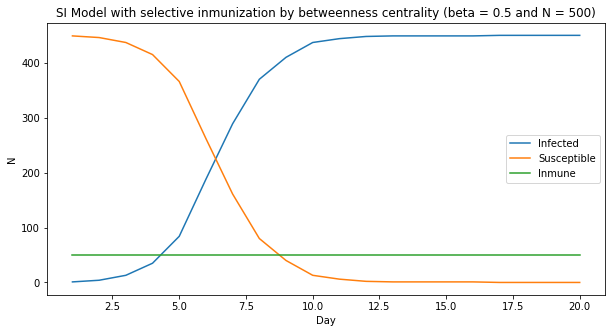

In [32]:
plt.figure(figsize = (10,5))
plt.plot(range(1,num_days+1), total_infected, label = 'Infected')
plt.plot(range(1,num_days+1), total_susceptible, label = 'Susceptible')
plt.plot(range(1,num_days+1), total_inmune, label = 'Inmune')
plt.xlabel('Day')
plt.ylabel('N')
plt.title('SI Model with selective inmunization by betweenness centrality (beta = {} and N = {})'.format(str(beta),str(n)))
plt.legend()
plt.show()

## 4. Deliverable

Simulate a cmodel a difusion transimion in a dynamic network
- nodes in a random geometric graph (see funcion `random_geometric_grpah`)
- implement a SI model on the network
- introduce dynamics:
  - nodes change position with random walks
  - nodes change positions with levy flights
- compare evolution in the three results
  - complete SI for each case (each case in pone plot)
  - compare I in all the cases (same plot)
    

First we define a random geometric graph without dynamics and implement a SI Model 

Day 1
Infected nodes: 1


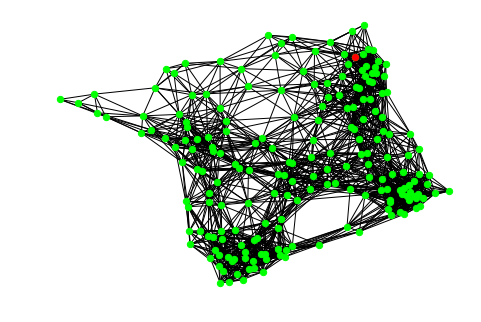

Day 2
Infected nodes: 7


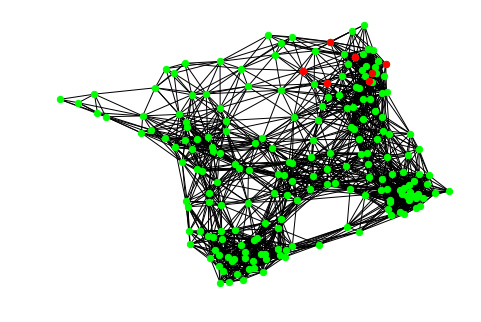

Day 3
Infected nodes: 18


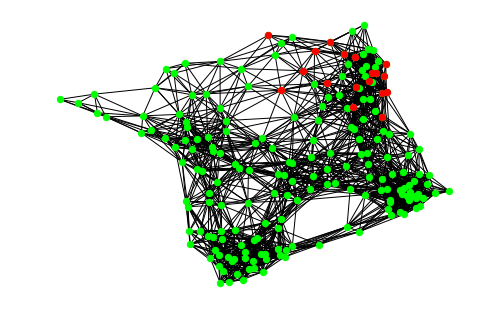

Day 4
Infected nodes: 35


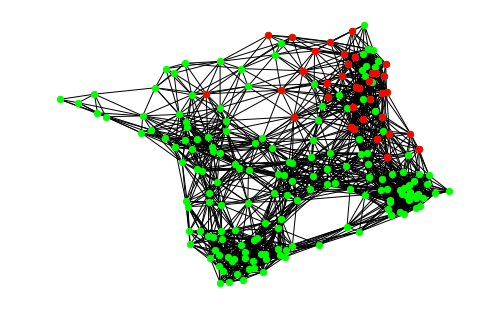

Day 5
Infected nodes: 52


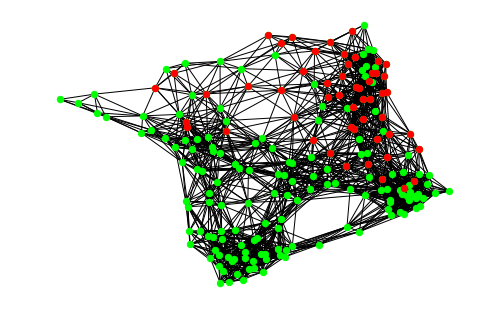

Day 6
Infected nodes: 75


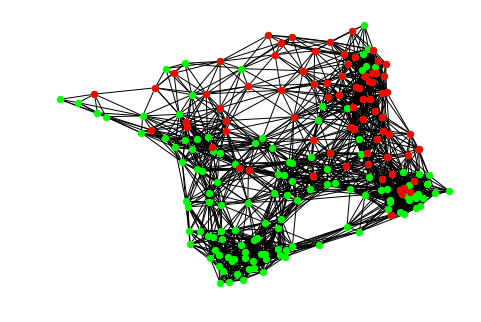

Day 7
Infected nodes: 96


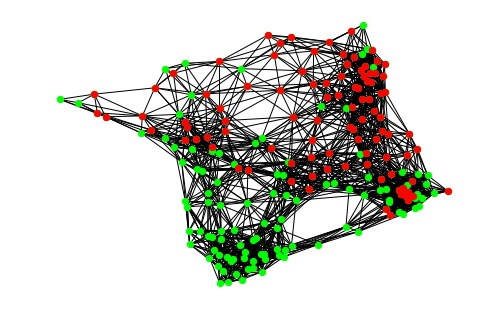

Day 8
Infected nodes: 110


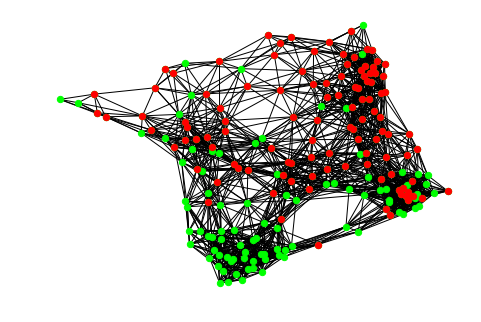

Day 9
Infected nodes: 123


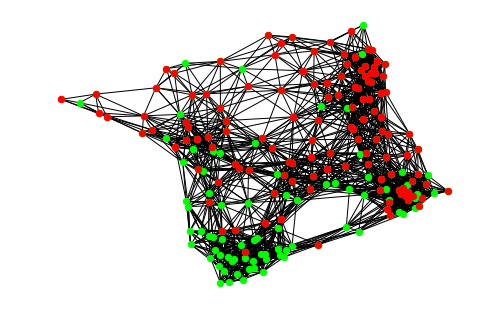

Day 10
Infected nodes: 146


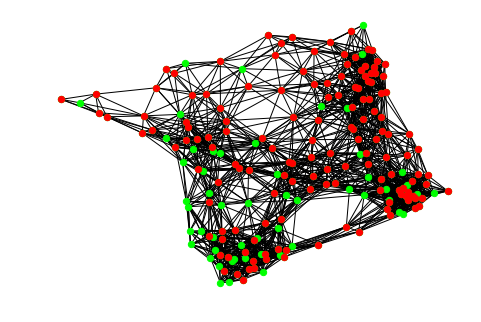

Day 11
Infected nodes: 159


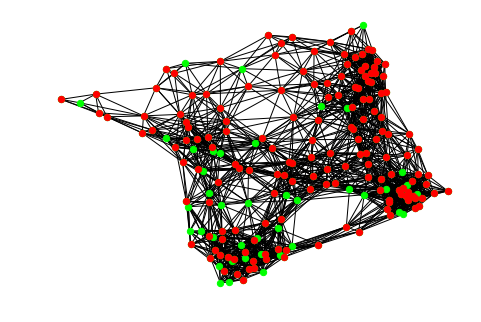

Day 12
Infected nodes: 174


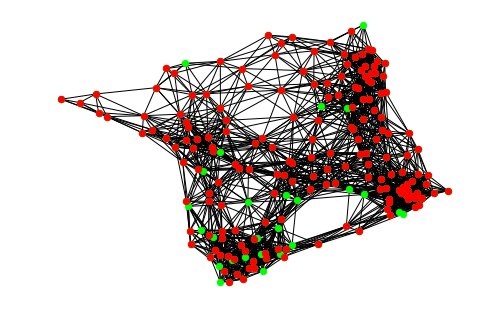

Day 13
Infected nodes: 180


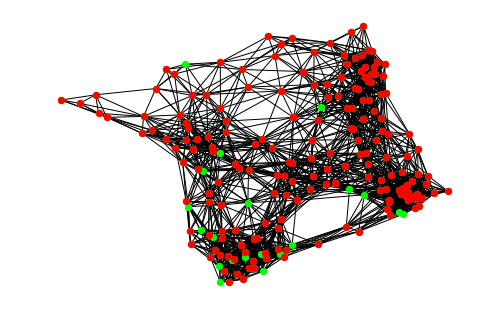

Day 14
Infected nodes: 184


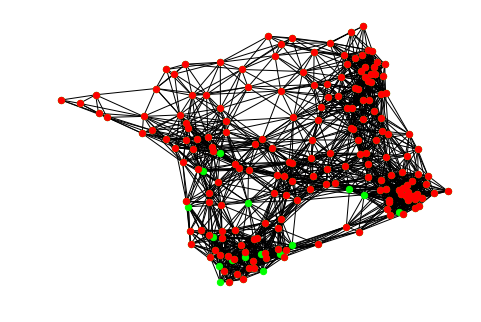

Day 15
Infected nodes: 187


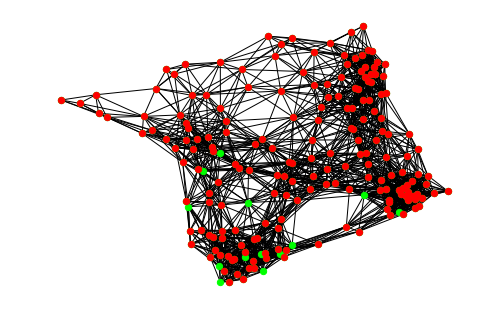

Day 16
Infected nodes: 189


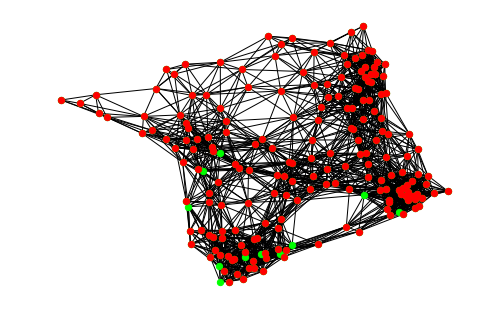

Day 17
Infected nodes: 191


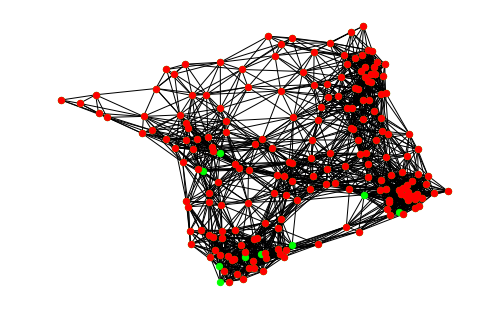

Day 18
Infected nodes: 192


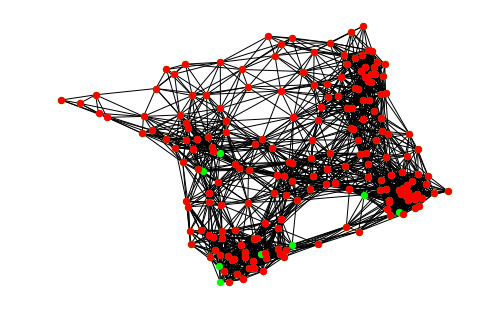

Day 19
Infected nodes: 195


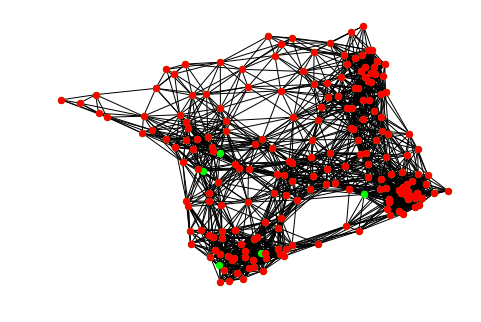

Day 20
Infected nodes: 196


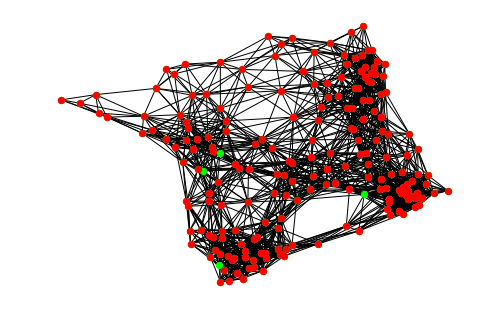

In [81]:
n , r = 200, 0.2
G = nx.random_geometric_graph(n, r)

pos = nx.spring_layout(G)
infected, susceptible = [], [n for n in G.nodes()]
total_infected, total_susceptible = [] , []
beta = 0.25
start_node = np.random.randint(n)
infected.append(start_node)
susceptible.remove(start_node)

total_infected.append(len(infected))
total_susceptible.append(len(susceptible))


#fig, axes = plt.subplots(2,2,figsize = (12,10))
day = 1
print('Day {}'.format(day))
print('Infected nodes: {}'.format(len(infected)))
nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
plt.show()

num_days = 20
for day in range(1,num_days):
    day += 1
    
    frontier = nx.node_boundary(G,infected)
    #frontier = frontier + [n for n in G.neighbors(node) if n not in infected]
    for node in frontier:
        p = random.random()
        if p < beta:
            infected.append(node)
            susceptible.remove(node)
    
    total_infected.append(len(infected))
    total_susceptible.append(len(susceptible))
    
    print('Day {}'.format(day))
    print('Infected nodes: {}'.format(len(infected)))
    nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
    nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
    plt.show()

Results are show in a line graph

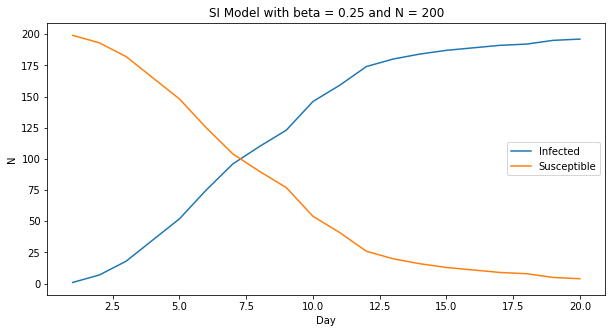

In [82]:
plt.figure(figsize = (10,5))
plt.plot(range(1,num_days+1), total_infected, label = 'Infected')
plt.plot(range(1,num_days+1), total_susceptible, label = 'Susceptible')
plt.xlabel('Day')
plt.ylabel('N')
plt.title('SI Model with beta = {} and N = {}'.format(beta,n))
plt.legend()
plt.show()

Introducing dynamics: Random Walks

Day 1
Infected nodes: 1


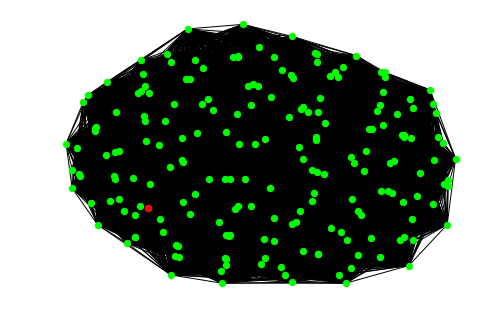

Day 2
Infected nodes: 24


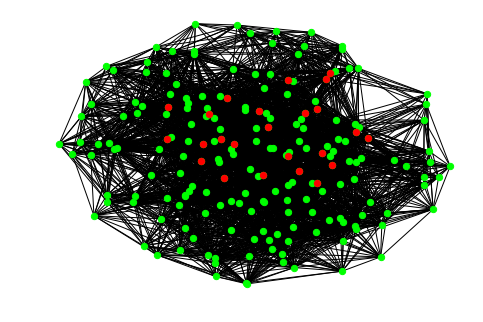

Day 3
Infected nodes: 69


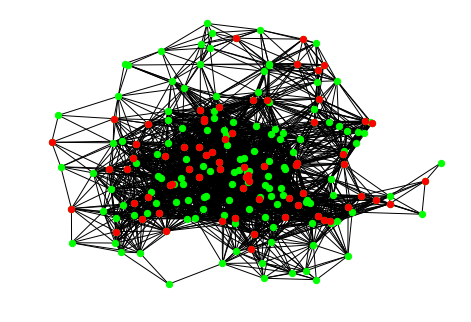

Day 4
Infected nodes: 110


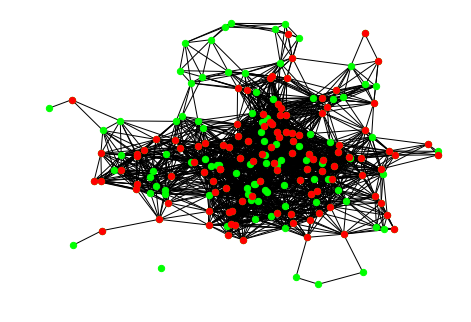

Day 5
Infected nodes: 129


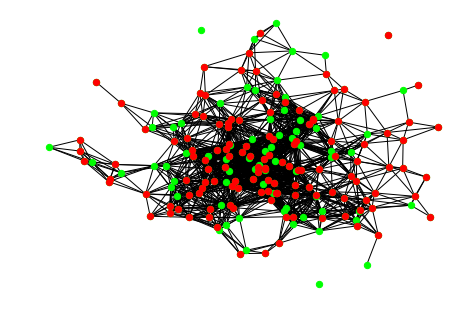

Day 6
Infected nodes: 147


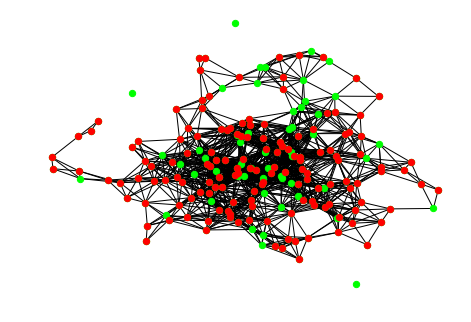

Day 7
Infected nodes: 157


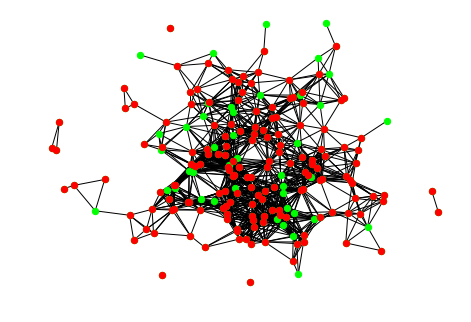

Day 8
Infected nodes: 168


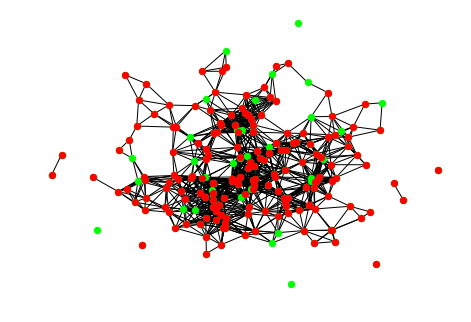

Day 9
Infected nodes: 173


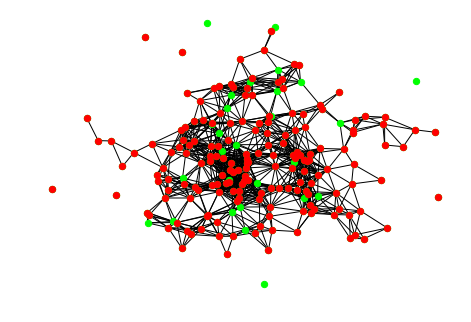

Day 10
Infected nodes: 178


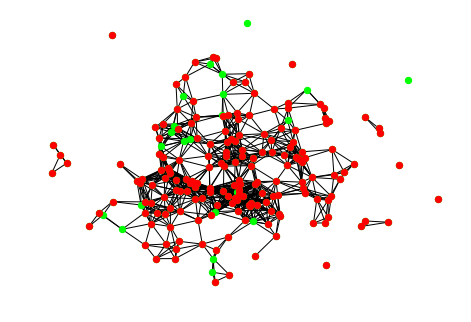

Day 11
Infected nodes: 180


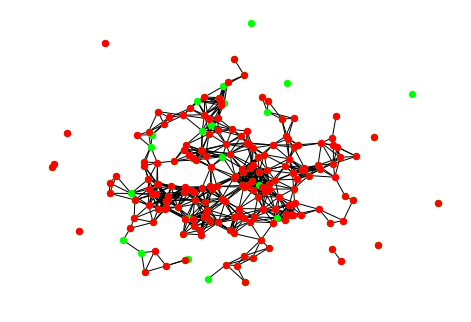

Day 12
Infected nodes: 184


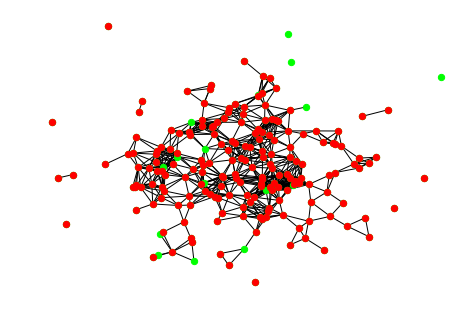

Day 13
Infected nodes: 189


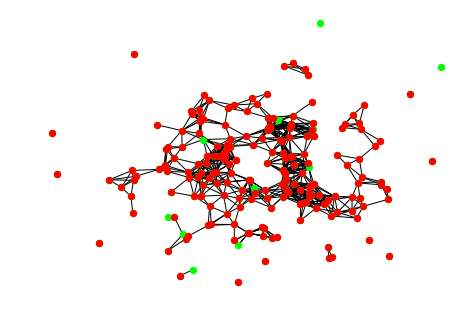

Day 14
Infected nodes: 193


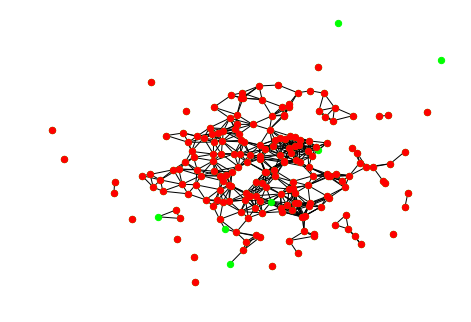

Day 15
Infected nodes: 195


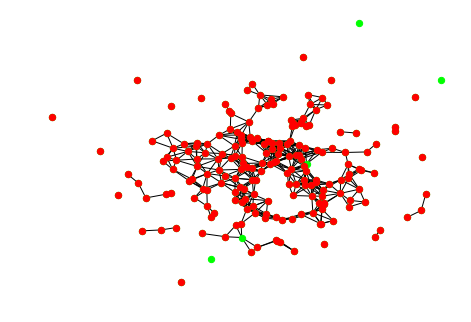

Day 16
Infected nodes: 195


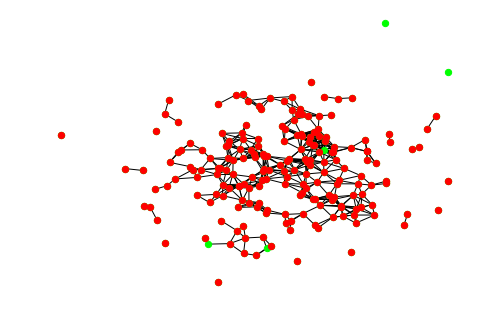

Day 17
Infected nodes: 195


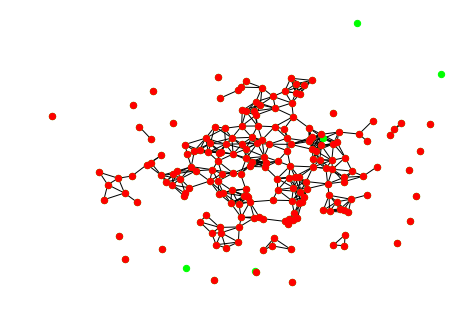

Day 18
Infected nodes: 195


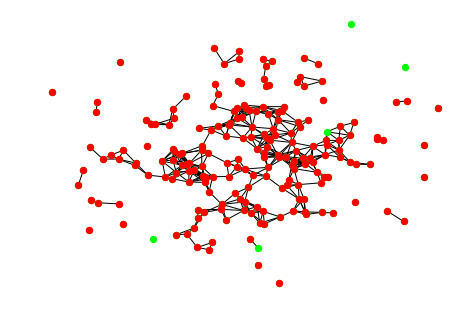

Day 19
Infected nodes: 195


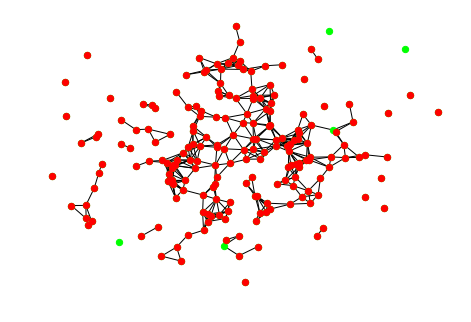

Day 20
Infected nodes: 196


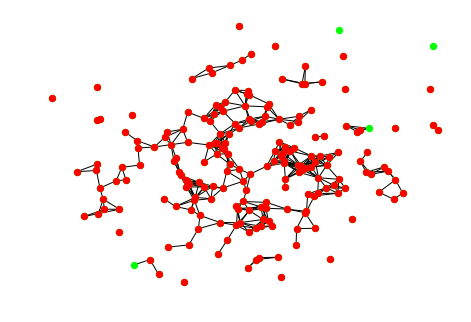

In [85]:
n , r = 200, 1
G = nx.random_geometric_graph(n, r)

pos = nx.spring_layout(G)

infected, susceptible = [], [n for n in G.nodes()]
total_infected_rw, total_susceptible = [] , []
beta = 0.25
start_node = np.random.randint(n)
infected.append(start_node)
susceptible.remove(start_node)

total_infected_rw.append(len(infected))
total_susceptible.append(len(susceptible))

x_t, y_t = [pos[0][0]],[pos[0][1]]
#fig, axes = plt.subplots(2,2,figsize = (12,10))
day = 1
print('Day {}'.format(day))
print('Infected nodes: {}'.format(len(infected)))
nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
plt.show()

num_days = 20
new_pos = pos.copy()
for day in range(1,num_days):
    day += 1
      
        
    #Change node positions in each step according to a random walk 
    for node,coords in new_pos.items():
        x,y = coords[0] , coords[1]
        alpha = np.random.rand() * 2 * np.pi
        new_x = x + np.cos(alpha)
        new_y = y + np.sin(alpha)
        new_pos[node] = np.array([new_x, new_y])
        if node == 0:
            x_t.append(new_x)
            y_t.append(new_y)
    
    # Define new RGG based on new positions 
    G = nx.random_geometric_graph(n, radius = 1, pos = new_pos)    
        
        
        
    #Infect with certain probability frontier nodes    
    frontier = nx.node_boundary(G,infected)
    #frontier = frontier + [n for n in G.neighbors(node) if n not in infected]
    for node in frontier:
        p = random.random()
        if p < beta:
            infected.append(node)
            susceptible.remove(node)
    
    total_infected_rw.append(len(infected))
    total_susceptible.append(len(susceptible))
    
    

    #Show graph with new positions
    print('Day {}'.format(day))
    print('Infected nodes: {}'.format(len(infected)))
    nx.draw(G,pos=new_pos, node_color = 'lime', node_size = 40)
    nx.draw_networkx_nodes(G.subgraph(infected),pos=new_pos,node_color='red', node_size = 40)
    plt.show()

Random walk of a specific node (0) in each of the steps

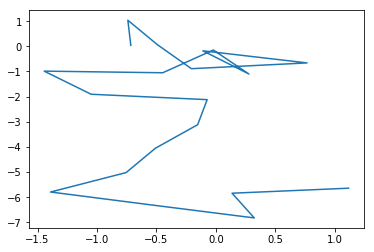

In [86]:
plt.plot(x_t,y_t)

Plot the SI Model evolutions

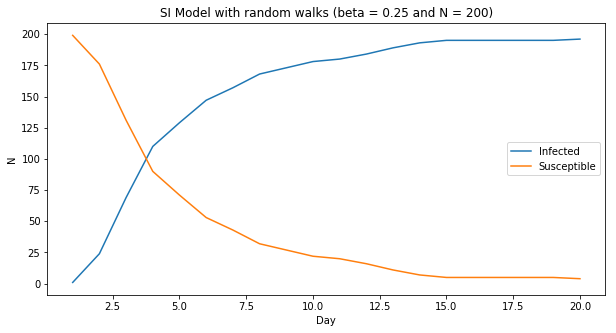

In [87]:
plt.figure(figsize = (10,5))
plt.plot(range(1,num_days+1), total_infected_rw, label = 'Infected')
plt.plot(range(1,num_days+1), total_susceptible, label = 'Susceptible')
plt.xlabel('Day')
plt.ylabel('N')
plt.title('SI Model with random walks (beta = {} and N = {})'.format(beta,n))
plt.legend()
plt.show()

Dynamics with levy flights

Day 1
Infected nodes: 1


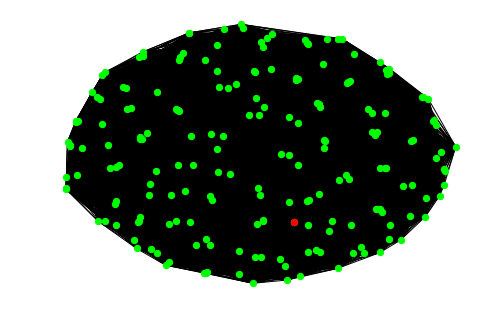

Day 2
Infected nodes: 30


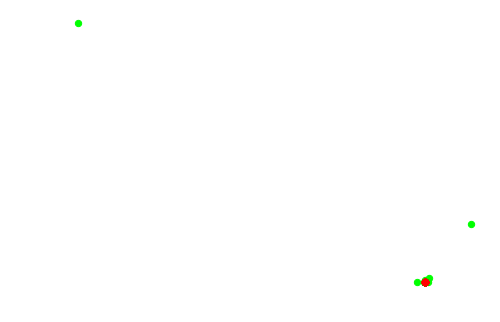

Day 3
Infected nodes: 63


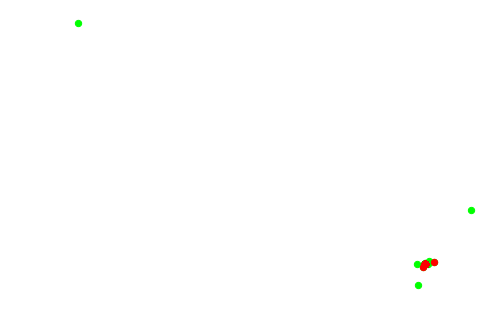

Day 4
Infected nodes: 75


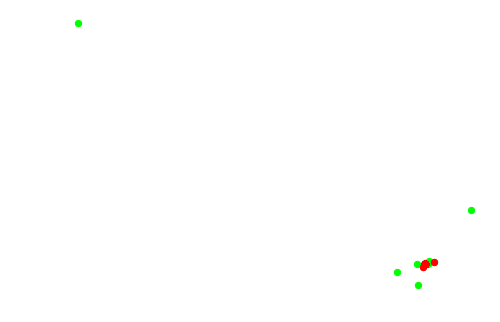

Day 5
Infected nodes: 85


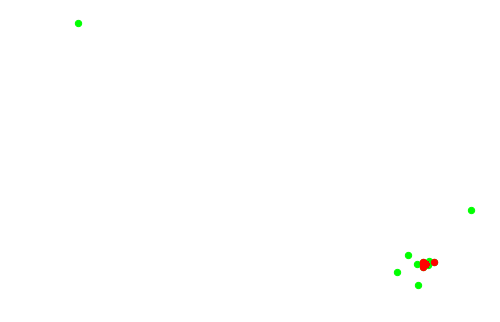

Day 6
Infected nodes: 91


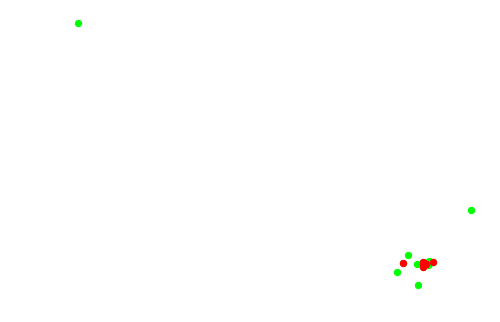

Day 7
Infected nodes: 99


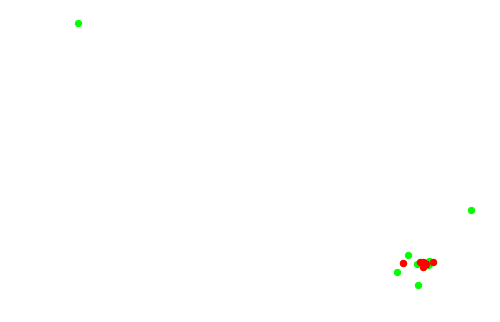

Day 8
Infected nodes: 103


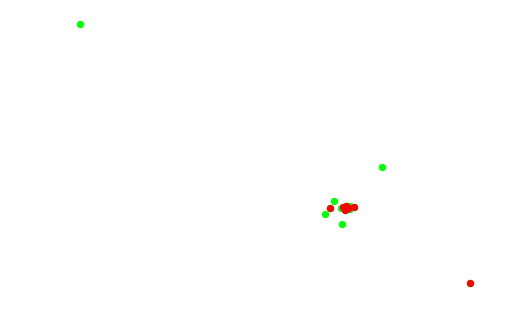

Day 9
Infected nodes: 106


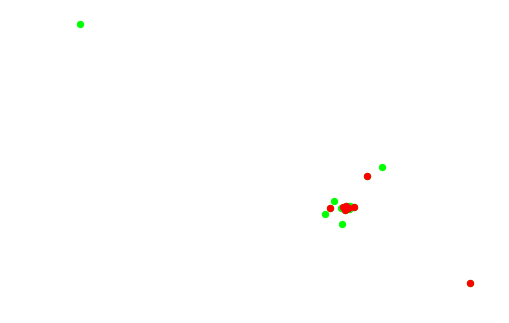

Day 10
Infected nodes: 108


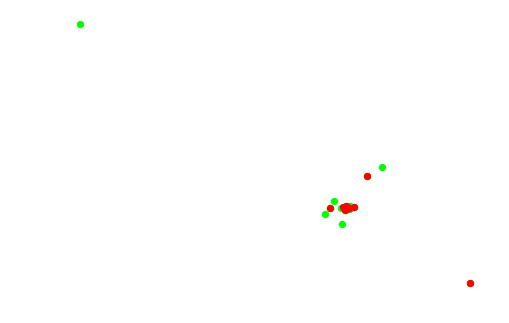

Day 11
Infected nodes: 109


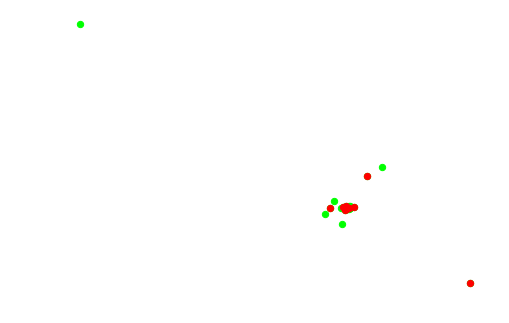

Day 12
Infected nodes: 109


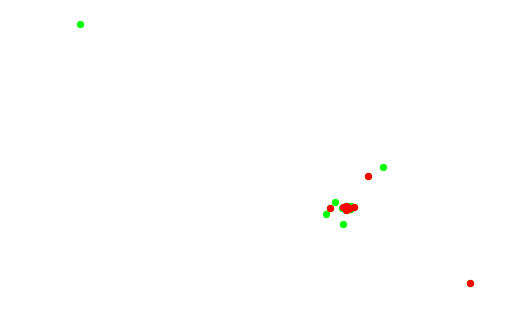

Day 13
Infected nodes: 110


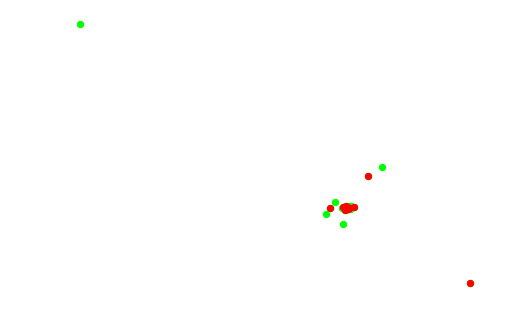

Day 14
Infected nodes: 110


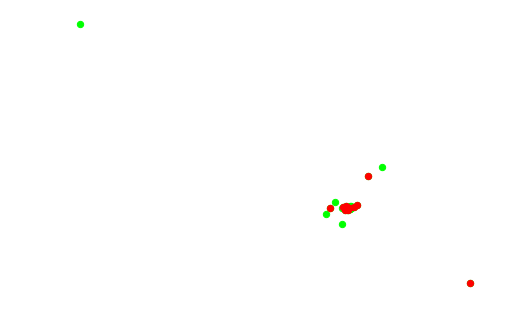

Day 15
Infected nodes: 113


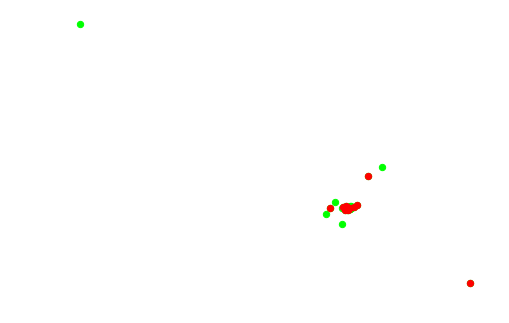

Day 16
Infected nodes: 113


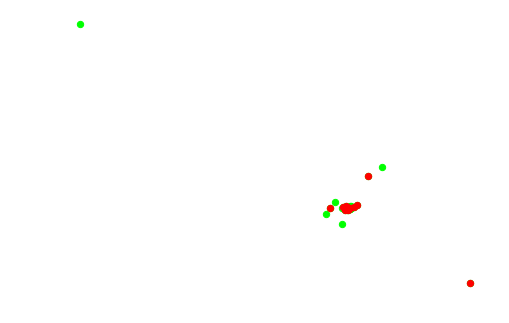

Day 17
Infected nodes: 114


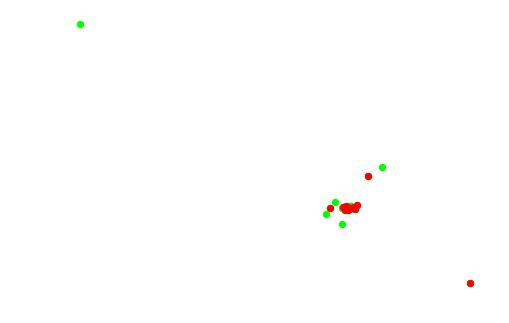

Day 18
Infected nodes: 114


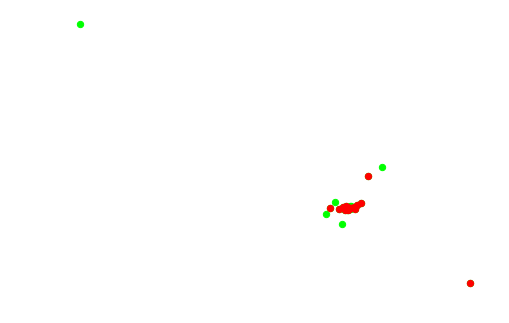

Day 19
Infected nodes: 114


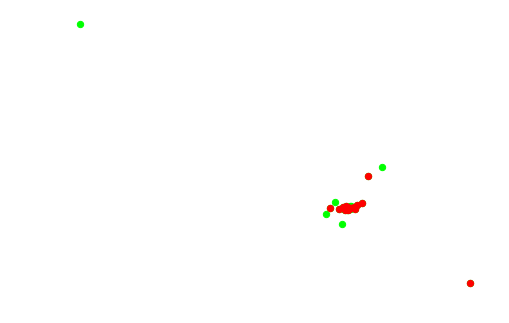

Day 20
Infected nodes: 114


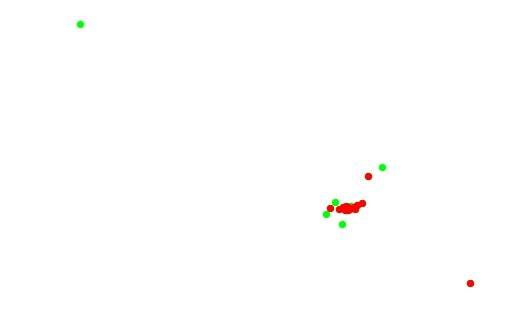

In [92]:
from scipy.stats import levy

n , r = 200, 5
G = nx.random_geometric_graph(n, r)

pos = nx.spring_layout(G)

infected, susceptible = [], [n for n in G.nodes()]
total_infected_lf, total_susceptible = [] , []
beta = 0.25
start_node = np.random.randint(n)
infected.append(start_node)
susceptible.remove(start_node)

total_infected_lf.append(len(infected))
total_susceptible.append(len(susceptible))

x_t, y_t = [pos[0][0]],[pos[0][1]]
#fig, axes = plt.subplots(2,2,figsize = (12,10))
day = 1
print('Day {}'.format(day))
print('Infected nodes: {}'.format(len(infected)))
nx.draw(G,pos=pos, node_color = 'lime', node_size = 40)
nx.draw_networkx_nodes(G.subgraph(infected),pos=pos,node_color='red', node_size = 40)
plt.show()

num_days = 20
new_pos = pos.copy()
for day in range(1,num_days):
    day += 1
      
        
    #Change node positions in each step according to a levy flight
    for node,coords in new_pos.items():
        x,y = coords[0] , coords[1]
        alpha = np.random.rand() * 2 * np.pi
        dist = levy.rvs(size=1)
        new_x = x + dist[0] * np.cos(alpha)
        new_y = y + dist[0] * np.sin(alpha)
        new_pos[node] = np.array([new_x, new_y])
        if node == 0:
            x_t.append(new_x)
            y_t.append(new_y)
    
    # Define new RGG based on new positions 
    G = nx.random_geometric_graph(n, radius = 5, pos = new_pos)    
        
        
        
    #Infect with certain probability frontier nodes    
    frontier = nx.node_boundary(G,infected)
    #frontier = frontier + [n for n in G.neighbors(node) if n not in infected]
    for node in frontier:
        p = random.random()
        if p < beta:
            infected.append(node)
            susceptible.remove(node)
    
    total_infected_lf.append(len(infected))
    total_susceptible.append(len(susceptible))
    
    

    #Show graph with new positions
    print('Day {}'.format(day))
    print('Infected nodes: {}'.format(len(infected)))
    nx.draw(G,pos=new_pos, node_color = 'lime', node_size = 40)
    nx.draw_networkx_nodes(G.subgraph(infected),pos=new_pos,node_color='red', node_size = 40)
    plt.show()

Levy flight of a specific node (0) in each step

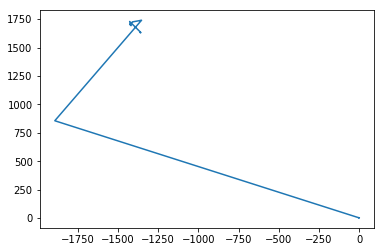

In [93]:
plt.plot(x_t,y_t)

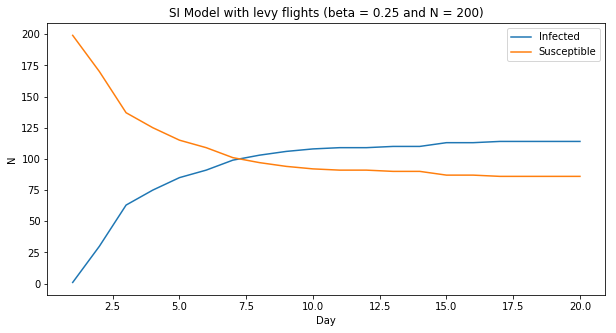

In [94]:
plt.figure(figsize = (10,5))
plt.plot(range(1,num_days+1), total_infected_lf, label = 'Infected')
plt.plot(range(1,num_days+1), total_susceptible, label = 'Susceptible')
plt.xlabel('Day')
plt.ylabel('N')
plt.title('SI Model with levy flights (beta = {} and N = {})'.format(beta,n))
plt.legend()
plt.show()

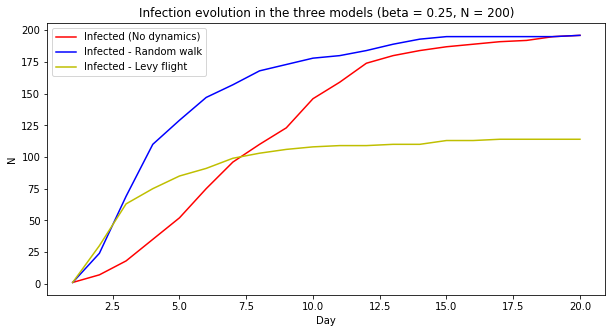

In [97]:
plt.figure(figsize = (10,5))
plt.plot(range(1,num_days+1), total_infected, c = 'r', label = 'Infected (No dynamics)')
plt.plot(range(1,num_days+1), total_infected_rw, c = 'b', label = 'Infected - Random walk')
plt.plot(range(1,num_days+1), total_infected_lf, c = 'y', label = 'Infected - Levy flight')
plt.xlabel('Day')
plt.ylabel('N')
plt.title('Infection evolution in the three models (beta = {}, N = {})'.format(beta,n))
plt.legend()
plt.show()